In [1]:
from PIL import Image
import tqdm
import os
import time
import collections

import torch
import torchvision
assert torch.cuda.is_available()
from torchvision.transforms import ToTensor
from torch.nn import functional as F

import numpy as np
import matplotlib.pyplot as plt

BATCH_SIZE = 53
VAL_SIZE = 0.2
IM_SIZE = (128, 128)
DEVICE = 'cuda:0'

----------------
## Создание Custom Dataset  и DataLoader
Объект класса ImageDataset подгружает файл с нужным изображением при вызове метода \__getitem__.

Работа происходит в цветовом пространстве HSV:
- hue - оттенок (image[0]),
- saturation - насыщенность (image[1]),
- value - значение яркости (image[2])

Яркость будет неизменным и опорным значением для модели, по которому будут рассчитываться два оставшихся параметра, влияющих на цвет.


In [2]:
def dataset_preparation(in_path, out_path, im_size):
    ''' перезаписывает файлы в другую папку + resize '''
    files_list = os.listdir(in_path)
    if not os.path.exists(out_path):
        os.makedirs(out_path)
    for file_n in tqdm.tqdm(files_list):
        with Image.open(in_path+file_n) as file:
            file.resize(im_size).save(out_path+file_n)

class ImageDataset(torch.utils.data.Dataset):
    ''' 
    Формат файлов: png или jpg
    amount - временное решение по ограничению кол-ва обучающих данных
    '''
    
    def __init__(self, path, transforms, amount = None, to_hsv = True):
        self.transforms = transforms
        self.to_hsv = to_hsv
        self.path = path
        
        is_image_filter = lambda value:('png' in value) or ('jpg' in value) or ('JPEG' in value)
        self.f_names = list(filter(is_image_filter, os.listdir(path)))[0:amount]
        self.len = len(self.f_names)
        
    
    def __len__(self):
        return self.len
    
    def __getitem__(self, index):
        with Image.open(self.path + self.f_names[index]) as file:
            image = self.transforms(file.convert('HSV')) 
            return image[2].unsqueeze(0), image[:2]     # unsqueeze на случай реализации vgg16
                                                        # image shape - [hue, sat, val], return [newax, h, s]

transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
])
dataset_preparation(in_path = 'imagenet_val_mini/',
                    out_path = 'im_dataset/',
                    im_size = IM_SIZE)
dataset = ImageDataset(path = 'im_dataset/', transforms = transforms)

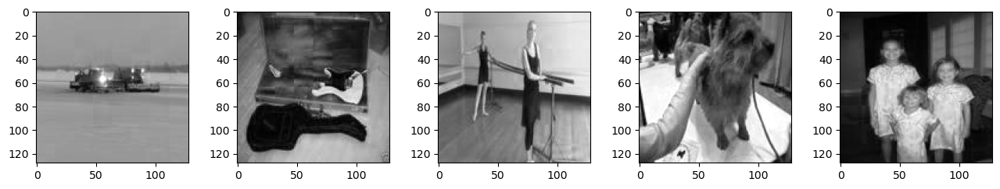

In [3]:
%matplotlib inline
_, ax = plt.subplots(1, 5, figsize = (13, 5))
plt.tight_layout()
for i in range(5):
    ax[i].imshow(dataset[i][0].permute(1, 2, 0), cmap = 'gray')

In [4]:
def val_split(dataset, val_size):
    ''' val_size задается в диапазоне 0..1 '''
    val_length = int(np.round(len(dataset) * val_size))
    val_idx = range(val_length)
    train_idx = range(val_length, len(dataset))
    
    train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
    val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)
    
    return train_sampler, val_sampler

train_sampler, val_sampler = val_split(dataset, val_size = VAL_SIZE)
train_loader = torch.utils.data.DataLoader(dataset, batch_size = BATCH_SIZE, sampler = train_sampler, drop_last = True)
val_loader = torch.utils.data.DataLoader(dataset, batch_size = BATCH_SIZE, sampler = val_sampler, drop_last = True)

---------------------------------------
## Архитектура модели
StylerNet - U-Net подобная архитектура

https://medium.com/@sanjay035/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb


In [5]:
class Discriminator(torch.nn.Module):
    def __init__(self, optim, batch_size):
        super(Discriminator, self).__init__()
        
        self.l1_conv = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels = 2, out_channels = 64, kernel_size = 3, padding = 1),
            torch.nn.LeakyReLU(0.2),
            torch.nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, stride = 2, padding = 1),
            torch.nn.Conv2d(in_channels = 64, out_channels = 32, kernel_size = 3, stride = 2, padding = 1),
            torch.nn.LeakyReLU(0.2),
            torch.nn.Conv2d(in_channels = 32, out_channels = 16, kernel_size = 3, stride = 2, padding = 1),
            torch.nn.Conv2d(in_channels = 16, out_channels = 8, kernel_size = 3, stride = 2, padding = 1)
        )
        
        self.batch_size = batch_size
        size = int(8 *((256 / 2 / 2 / 2 / 2 / 2)**2))
        
        self.l2_fc = torch.nn.Sequential(
            torch.nn.Linear(size, 32),
            torch.nn.Dropout(0.3),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 1),
            torch.nn.Sigmoid()
        )
        
        self.loss_fn = torch.nn.BCELoss()
        self.optim = optim(self.parameters(), lr = .0001)
    
    def calc_loss(self, outputs, targets):
        return self.loss_fn(outputs, targets)
    
    def forward(self, x):
        x = self.l1_conv(x)
#         print('disc conv: ', x.shape)
        x = x.view(self.batch_size, -1)
        x = self.l2_fc(x)
        return x


class StylerNet(torch.nn.Module):
    ''' 
    StylerNet - U-net подобная архитектура
    идея: https://medium.com/@sanjay035/sketch-to-color-anime-translation-using-generative-adversarial-networks-gans-8f4f69594aeb
    '''
    
    def __init__(self, optim):
        super(StylerNet, self).__init__()

        self.l1_encoder = torch.nn.Sequential(
            
            collections.OrderedDict({
                'conv1': torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels = 1, out_channels = 64, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, padding = 1, stride = 2),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(64)
                ),
                'conv2': torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, padding = 1, stride = 2),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(128)
                ),
                'conv3': torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, padding = 1, stride = 2),
                    torch.nn.LeakyReLU(), 
                    torch.nn.BatchNorm2d(256),
                ),
                'conv4': torch.nn.Sequential(            
                    torch.nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1, stride = 2),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(512)
                )
            })
        )
        self.l2_decoder = torch.nn.Sequential(
            
            collections.OrderedDict({
                'convTranspose1': torch.nn.Sequential(
                    torch.nn.ConvTranspose2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 512, out_channels = 256, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(256)
                ),
                'convTranspose2': torch.nn.Sequential(
                    torch.nn.ConvTranspose2d(in_channels = 512, out_channels = 256, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(128),
                ),
                'convTranspose3': torch.nn.Sequential(            
                    torch.nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(64),
                ),
                'convTranspose4': torch.nn.Sequential(
                    torch.nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 3, padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.ConvTranspose2d(in_channels = 64, out_channels = 32, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
                    torch.nn.LeakyReLU(),
                    torch.nn.BatchNorm2d(32),
                ),
                'convOut': torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels = 32, out_channels = 2, kernel_size = 3, padding = 1),
                    torch.nn.BatchNorm2d(2),
                    torch.nn.ReLU()
                )
            })    
        )
        self.loss_fn = torch.nn.MSELoss()
        self.optim = optim(self.parameters(), lr = .001, weight_decay=0.01)
        
    def forward(self, x):
#         print('x input: ', x.shape)
#         with torch.no_grad():
        x1 = self.l1_encoder.conv1(x)          # (, 64, 64, 64)
        x2 = self.l1_encoder.conv2(x1)         # (, 128, 32, 32)
        x3 = self.l1_encoder.conv3(x2)         # (, 256, 16, 16)
        x4 = self.l1_encoder.conv4(x3)         # (, 512, 8, 8)
        
        x = self.l2_decoder.convTranspose1(x4)
        
        x = torch.cat((x, x3), dim = 1)        # ( , 512, 16, 16)
        x = self.l2_decoder.convTranspose2(x)  
        x = torch.cat((x, x2), dim = 1)        # ( , 256, 32, 32)
        x = self.l2_decoder.convTranspose3(x)
        x = torch.cat((x, x1), dim = 1)        # ( , 128, 64, 64)
        x = self.l2_decoder.convTranspose4(x)  # ( , 32, 128, 128)
        
        x = self.l2_decoder.convOut(x)
#         print('decoder out: ', x.shape)
        return x
    
    def calc_loss(self, outputs, targets):
        return self.loss_fn(outputs, targets)
            
    def predict(self, inputs):
        topillow = torchvision.transforms.ToPILImage('HSV')
        image = topillow(torch.hstack([self(inputs.to(DEVICE)), inputs.to(DEVICE)])[0])
        return image
    def checkpoint(self, direction, epoch):
        torch.save(self.state_dict, direction + f'model_{epoch}')

--------------
## Обучение

In [6]:
def train_model3(model, discriminator, train_loader, epochs = 1, device = DEVICE):
    model.to(device)
    model.train()
    discriminator.to(device)
    discriminator.train()
    
    # для val_loss
    calc_loss = torch.nn.MSELoss()
    topillow = torchvision.transforms.ToPILImage('HSV')
    image = next(iter(train_loader))     # image shape   [[s, h], v]
    
    point = np.ceil(len(train_loader) / 10)
    losses = [np.array([]), np.array([])]
    
    for epoch in range(epochs):
        model.to(device)
        start_time = time.time()
        print(f'Epoch {epoch}/{epochs}: <', end = '')
        
        for i, (inputs, targets) in enumerate(train_loader):
            
            discriminator.optim.zero_grad()
            model_outs = model(inputs.to(device)).detach()
            disc_fake_outs = discriminator(model_outs)
            disc_real_outs = discriminator(targets.to(device))
            disc_fake_loss = discriminator.calc_loss(disc_fake_outs, torch.zeros_like(disc_fake_outs))         
            disc_real_loss = discriminator.calc_loss(disc_real_outs, torch.ones_like(disc_real_outs))
            disc_loss = disc_real_loss + disc_fake_loss
            disc_loss.backward()
            if disc_loss > 0.02:  
                discriminator.optim.step()

            model.optim.zero_grad()
            model_outs = model(inputs.to(device))
            disc_fake_outs = discriminator(model_outs)
            model_loss = model.calc_loss(disc_fake_outs, torch.ones_like(disc_fake_outs))
            model_loss.backward()
            model.optim.step()
            
            
            if not i % point:
                print('=', end = '')
                
        print(f'> ------- disc loss = {disc_loss}, model loss = {model_loss}, time = {np.round(time.time() - start_time)}s')
        
        losses[0] = np.append(losses[0], disc_loss.detach().to('cpu').numpy())
        losses[1] = np.append(losses[1], model_loss.detach().to('cpu').numpy())
        
        
        if not epoch % 5:
            model.checkpoint('checkpoints/', epoch)
            
            # расчет validation loss    
            with torch.no_grad():                  
                val_loss = 0
                for i, (inputs, targets) in enumerate(val_loader):
                    outputs = model(inputs.to(device))
                    val_loss += calc_loss(outputs, targets.to(device))
#                 val_loss = val_loss / i
                print(f'\nValidation loss = {val_loss}')
                
                # визуальный вывод
                fake_im = model.predict(image[0])
                real_im = topillow(torch.hstack((image[1], image[0]))[0])
                _, ax = plt.subplots(1, 3, figsize = (10, 2))
                plt.tight_layout()
                ax[0].set_title('fake image')
                ax[0].imshow(fake_im)
                ax[1].set_title('real image')
                ax[1].imshow(real_im)
                ax[2].set_title('losses')
                ax[2].plot(losses[0], label = 'discriminator loss')
                ax[2].plot(losses[1], label = 'model loss')
                ax[2].legend()
                plt.show()
                

    return losses

In [7]:
model = StylerNet(optim = torch.optim.Adam)
discriminator = Discriminator(optim = torch.optim.Adam, batch_size = BATCH_SIZE)

model_params_amount = (sum(p.numel() for p in model.parameters()))
disc_params_amount = (sum(p.numel() for p in discriminator.parameters()))
params_total_amount = model_params_amount + disc_params_amount
print(f'Количество параметров модели: {model_params_amount}')
print(f'Количество параметров дискриминатора: {disc_params_amount}')
print(f'Количество параметров общее: {params_total_amount}')

Количество параметров модели: 10163430
Количество параметров дискриминатора: 78841
Количество параметров общее: 10242271


In [8]:
# prediction = model(next(iter(train_loader))[0])
# prediction.shape

In [9]:
# optim = torch.optim.Adam
# model_copy = StylerNet(optim)
# model_copy.load_state_dict(model.state_dict())

In [10]:
# disc_state_dict = discriminator.state_dict()
# discriminator_copy = Discriminator(optim)
# discriminator_copy.load_state_dict(disc_state_dict)

Epoch 0/1000: <==========> ------- disc loss = 0.7423771619796753, model loss = 1.1533575057983398, time = 38.0s

Validation loss = 3.2717597484588623


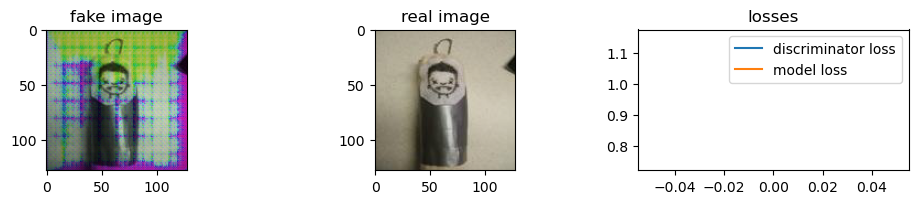

Epoch 1/1000: <==========> ------- disc loss = 0.8274332284927368, model loss = 1.3657413721084595, time = 38.0s
Epoch 2/1000: <==========> ------- disc loss = 0.9812067151069641, model loss = 1.0838297605514526, time = 38.0s
Epoch 3/1000: <==========> ------- disc loss = 1.1967875957489014, model loss = 1.3252646923065186, time = 38.0s
Epoch 4/1000: <==========> ------- disc loss = 1.3586161136627197, model loss = 1.085494041442871, time = 39.0s
Epoch 5/1000: <==========> ------- disc loss = 1.1116275787353516, model loss = 0.9604202508926392, time = 39.0s

Validation loss = 3.6552391052246094


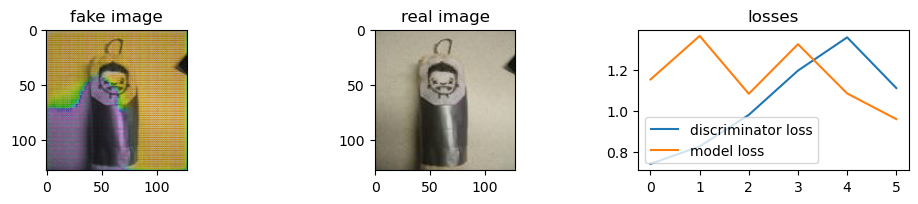

Epoch 6/1000: <==========> ------- disc loss = 1.2760860919952393, model loss = 1.0244369506835938, time = 39.0s
Epoch 7/1000: <==========> ------- disc loss = 1.1693089008331299, model loss = 0.9673498272895813, time = 39.0s
Epoch 8/1000: <==========> ------- disc loss = 1.3318610191345215, model loss = 0.8004618287086487, time = 39.0s
Epoch 9/1000: <==========> ------- disc loss = 1.3139653205871582, model loss = 0.7883913516998291, time = 39.0s
Epoch 10/1000: <==========> ------- disc loss = 1.322691559791565, model loss = 0.859710693359375, time = 39.0s

Validation loss = 3.3437623977661133


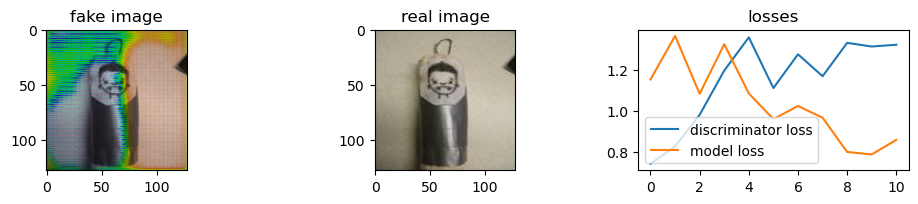

Epoch 11/1000: <==========> ------- disc loss = 1.3118302822113037, model loss = 0.7972425222396851, time = 39.0s
Epoch 12/1000: <==========> ------- disc loss = 1.2971084117889404, model loss = 0.736074686050415, time = 39.0s
Epoch 13/1000: <==========> ------- disc loss = 1.349454402923584, model loss = 0.8049121499061584, time = 39.0s
Epoch 14/1000: <==========> ------- disc loss = 1.3726047277450562, model loss = 0.7801488041877747, time = 39.0s
Epoch 15/1000: <==========> ------- disc loss = 1.3736858367919922, model loss = 0.7639628052711487, time = 39.0s

Validation loss = 3.6254701614379883


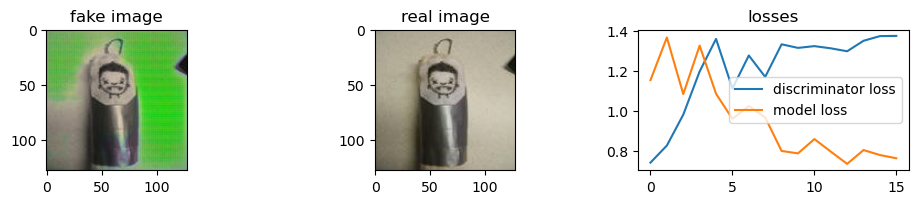

Epoch 16/1000: <==========> ------- disc loss = 1.3534059524536133, model loss = 0.6488314867019653, time = 39.0s
Epoch 17/1000: <==========> ------- disc loss = 1.3826594352722168, model loss = 0.7269493341445923, time = 39.0s
Epoch 18/1000: <==========> ------- disc loss = 1.3480024337768555, model loss = 0.7276039719581604, time = 39.0s
Epoch 19/1000: <==========> ------- disc loss = 1.3576894998550415, model loss = 0.7398906946182251, time = 39.0s
Epoch 20/1000: <==========> ------- disc loss = 1.3520891666412354, model loss = 0.6726993918418884, time = 39.0s

Validation loss = 3.148519992828369


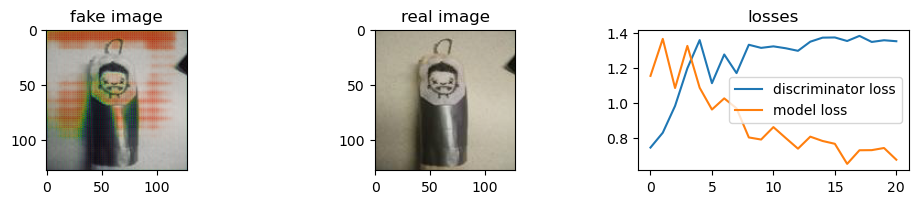

Epoch 21/1000: <==========> ------- disc loss = 1.3844761848449707, model loss = 0.7280339002609253, time = 39.0s
Epoch 22/1000: <==========> ------- disc loss = 1.3645310401916504, model loss = 0.6659623980522156, time = 39.0s
Epoch 23/1000: <==========> ------- disc loss = 1.3545408248901367, model loss = 0.7542632818222046, time = 39.0s
Epoch 24/1000: <==========> ------- disc loss = 1.3892251253128052, model loss = 0.6577619314193726, time = 39.0s
Epoch 25/1000: <==========> ------- disc loss = 1.3690242767333984, model loss = 0.7213385105133057, time = 39.0s

Validation loss = 3.536947250366211


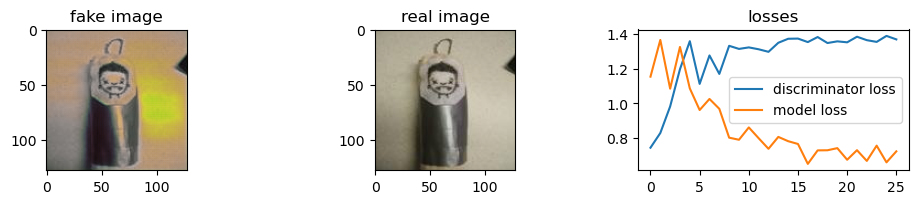

Epoch 26/1000: <==========> ------- disc loss = 1.3439544439315796, model loss = 0.7143276929855347, time = 39.0s
Epoch 27/1000: <==========> ------- disc loss = 1.3687410354614258, model loss = 0.6740232110023499, time = 39.0s
Epoch 28/1000: <==========> ------- disc loss = 1.3604161739349365, model loss = 0.6649513244628906, time = 39.0s
Epoch 29/1000: <==========> ------- disc loss = 1.3313567638397217, model loss = 0.7242435216903687, time = 39.0s
Epoch 30/1000: <==========> ------- disc loss = 1.370365023612976, model loss = 0.721243679523468, time = 39.0s

Validation loss = 2.9263832569122314


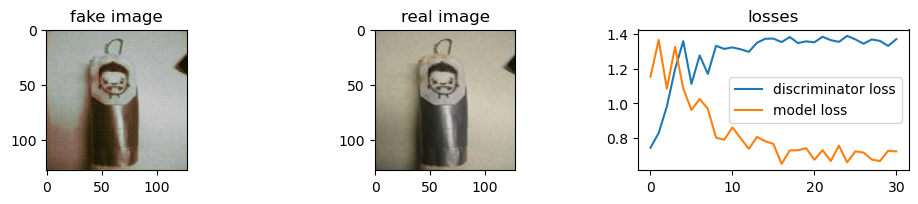

Epoch 31/1000: <==========> ------- disc loss = 1.371572494506836, model loss = 0.7450535297393799, time = 39.0s
Epoch 32/1000: <==========> ------- disc loss = 1.3857334852218628, model loss = 0.6756001710891724, time = 39.0s
Epoch 33/1000: <==========> ------- disc loss = 1.3695485591888428, model loss = 0.7038886547088623, time = 39.0s
Epoch 34/1000: <==========> ------- disc loss = 1.3391271829605103, model loss = 0.7005922198295593, time = 38.0s
Epoch 35/1000: <==========> ------- disc loss = 1.3642139434814453, model loss = 0.7165904641151428, time = 39.0s

Validation loss = 2.9054677486419678


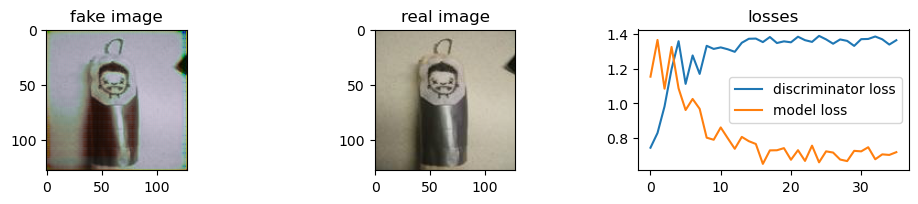

Epoch 36/1000: <==========> ------- disc loss = 1.3887916803359985, model loss = 0.6696062088012695, time = 38.0s
Epoch 37/1000: <==========> ------- disc loss = 1.3443689346313477, model loss = 0.6861665844917297, time = 38.0s
Epoch 38/1000: <==========> ------- disc loss = 1.371005654335022, model loss = 0.7076259851455688, time = 38.0s
Epoch 39/1000: <==========> ------- disc loss = 1.3021998405456543, model loss = 0.5994498133659363, time = 38.0s
Epoch 40/1000: <==========> ------- disc loss = 1.2631210088729858, model loss = 0.7739577293395996, time = 38.0s

Validation loss = 2.7703843116760254


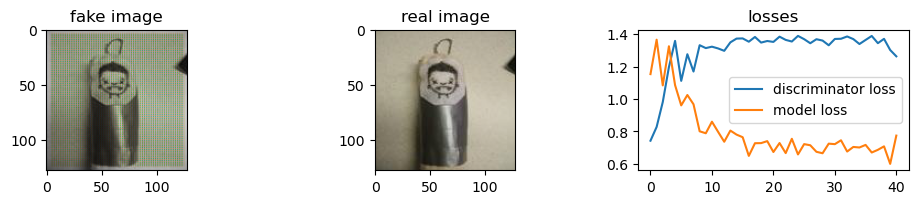

Epoch 41/1000: <==========> ------- disc loss = 1.3774819374084473, model loss = 0.6819254159927368, time = 38.0s
Epoch 42/1000: <==========> ------- disc loss = 1.3729609251022339, model loss = 0.6863793730735779, time = 38.0s
Epoch 43/1000: <==========> ------- disc loss = 1.3781238794326782, model loss = 0.7315365672111511, time = 38.0s
Epoch 44/1000: <==========> ------- disc loss = 1.3169023990631104, model loss = 0.725916862487793, time = 38.0s
Epoch 45/1000: <==========> ------- disc loss = 1.3109930753707886, model loss = 0.7135481834411621, time = 38.0s

Validation loss = 2.7273263931274414


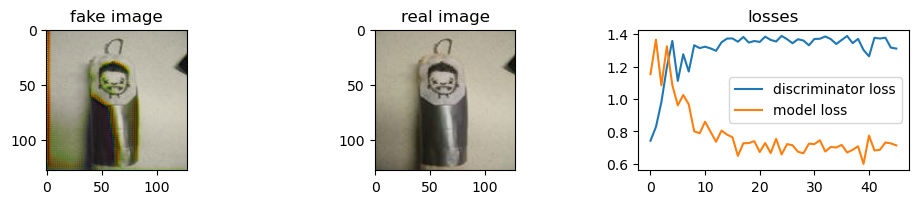

Epoch 46/1000: <==========> ------- disc loss = 1.332801342010498, model loss = 0.6638288497924805, time = 38.0s
Epoch 47/1000: <==========> ------- disc loss = 1.3840386867523193, model loss = 0.8056509494781494, time = 38.0s
Epoch 48/1000: <==========> ------- disc loss = 1.372058391571045, model loss = 0.6987884640693665, time = 38.0s
Epoch 49/1000: <==========> ------- disc loss = 1.3806055784225464, model loss = 0.7129037380218506, time = 38.0s
Epoch 50/1000: <==========> ------- disc loss = 1.346274971961975, model loss = 0.7294370532035828, time = 38.0s

Validation loss = 2.73105788230896


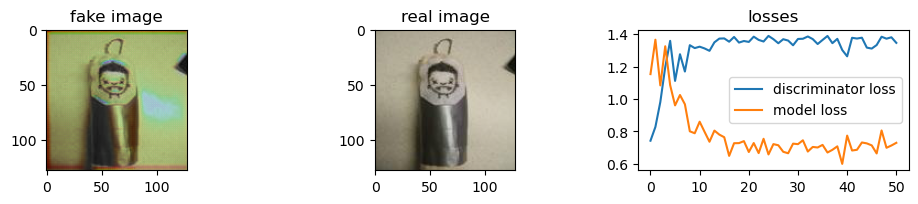

Epoch 51/1000: <==========> ------- disc loss = 1.2658376693725586, model loss = 0.7074959874153137, time = 38.0s
Epoch 52/1000: <==========> ------- disc loss = 1.2468984127044678, model loss = 0.7543466091156006, time = 38.0s
Epoch 53/1000: <==========> ------- disc loss = 1.3970420360565186, model loss = 0.6491758823394775, time = 38.0s
Epoch 54/1000: <==========> ------- disc loss = 1.3728289604187012, model loss = 0.7624320387840271, time = 38.0s
Epoch 55/1000: <==========> ------- disc loss = 1.353332281112671, model loss = 0.6855512261390686, time = 38.0s

Validation loss = 3.1346490383148193


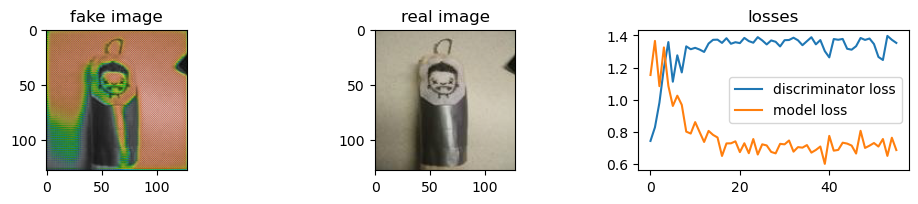

Epoch 56/1000: <==========> ------- disc loss = 1.385056495666504, model loss = 0.7196313738822937, time = 38.0s
Epoch 57/1000: <==========> ------- disc loss = 1.3296921253204346, model loss = 0.7962536215782166, time = 38.0s
Epoch 58/1000: <==========> ------- disc loss = 1.3500515222549438, model loss = 0.7692530751228333, time = 38.0s
Epoch 59/1000: <==========> ------- disc loss = 1.2968411445617676, model loss = 0.7414241433143616, time = 38.0s
Epoch 60/1000: <==========> ------- disc loss = 1.2873008251190186, model loss = 0.7119354009628296, time = 37.0s

Validation loss = 2.7153446674346924


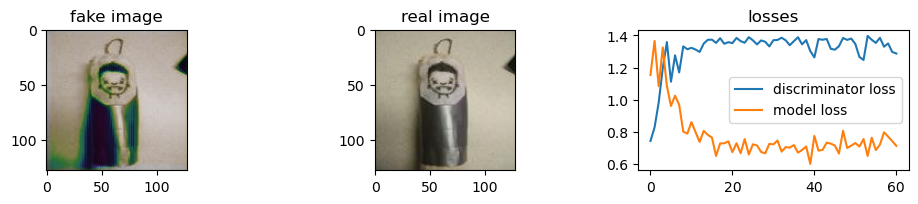

Epoch 61/1000: <==========> ------- disc loss = 1.2750682830810547, model loss = 0.7483549118041992, time = 37.0s
Epoch 62/1000: <==========> ------- disc loss = 1.2921807765960693, model loss = 0.7136421203613281, time = 38.0s
Epoch 63/1000: <==========> ------- disc loss = 1.1385078430175781, model loss = 0.8542418479919434, time = 38.0s
Epoch 64/1000: <==========> ------- disc loss = 1.0481946468353271, model loss = 1.1973153352737427, time = 38.0s
Epoch 65/1000: <==========> ------- disc loss = 1.0991275310516357, model loss = 0.8366274237632751, time = 38.0s

Validation loss = 2.9951682090759277


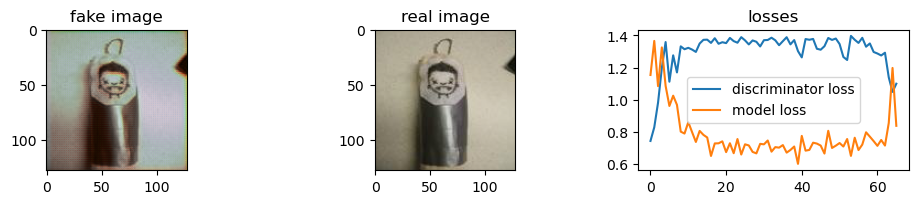

Epoch 66/1000: <==========> ------- disc loss = 1.2320533990859985, model loss = 1.023364782333374, time = 38.0s
Epoch 67/1000: <==========> ------- disc loss = 1.324787974357605, model loss = 1.0379184484481812, time = 37.0s
Epoch 68/1000: <==========> ------- disc loss = 1.1532421112060547, model loss = 1.081984043121338, time = 38.0s
Epoch 69/1000: <==========> ------- disc loss = 0.7364001870155334, model loss = 1.1905548572540283, time = 37.0s
Epoch 70/1000: <==========> ------- disc loss = 0.7679652571678162, model loss = 2.129704713821411, time = 37.0s

Validation loss = 3.8868134021759033


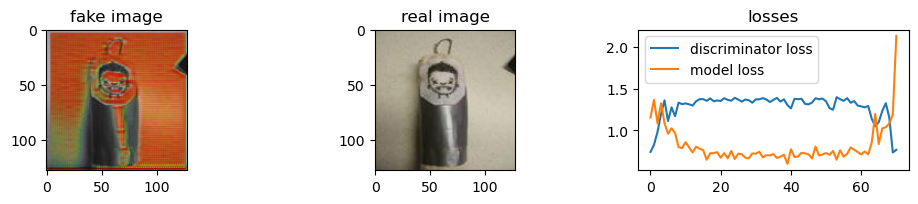

Epoch 71/1000: <==========> ------- disc loss = 0.5432902574539185, model loss = 1.80718195438385, time = 37.0s
Epoch 72/1000: <==========> ------- disc loss = 0.525416910648346, model loss = 2.4800026416778564, time = 37.0s
Epoch 73/1000: <==========> ------- disc loss = 0.47892874479293823, model loss = 2.0511066913604736, time = 37.0s
Epoch 74/1000: <==========> ------- disc loss = 0.3533326983451843, model loss = 2.1545238494873047, time = 37.0s
Epoch 75/1000: <==========> ------- disc loss = 0.8122516870498657, model loss = 1.776136040687561, time = 37.0s

Validation loss = 3.514975070953369


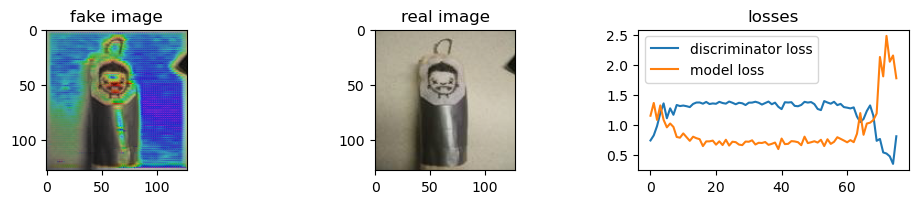

Epoch 76/1000: <==========> ------- disc loss = 0.941206693649292, model loss = 1.2980022430419922, time = 37.0s
Epoch 77/1000: <==========> ------- disc loss = 0.9522578716278076, model loss = 1.3341304063796997, time = 37.0s
Epoch 78/1000: <==========> ------- disc loss = 1.3327999114990234, model loss = 1.1857500076293945, time = 37.0s
Epoch 79/1000: <==========> ------- disc loss = 0.6159454584121704, model loss = 1.5291239023208618, time = 37.0s
Epoch 80/1000: <==========> ------- disc loss = 1.14616060256958, model loss = 1.5460087060928345, time = 37.0s

Validation loss = 3.1536343097686768


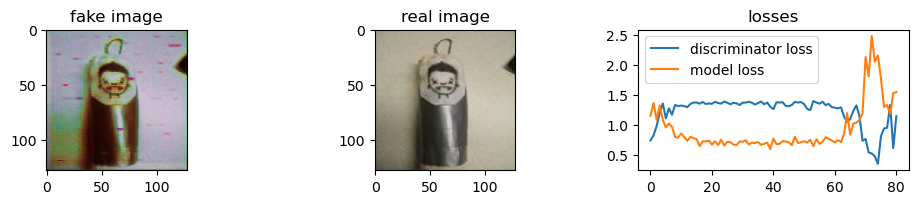

Epoch 81/1000: <==========> ------- disc loss = 1.0383901596069336, model loss = 1.5811073780059814, time = 37.0s
Epoch 82/1000: <==========> ------- disc loss = 0.9133286476135254, model loss = 1.1328668594360352, time = 37.0s
Epoch 83/1000: <==========> ------- disc loss = 0.9139202833175659, model loss = 1.2808020114898682, time = 37.0s
Epoch 84/1000: <==========> ------- disc loss = 0.7814005613327026, model loss = 1.4389173984527588, time = 37.0s
Epoch 85/1000: <==========> ------- disc loss = 1.0113816261291504, model loss = 1.3426228761672974, time = 37.0s

Validation loss = 3.334801197052002


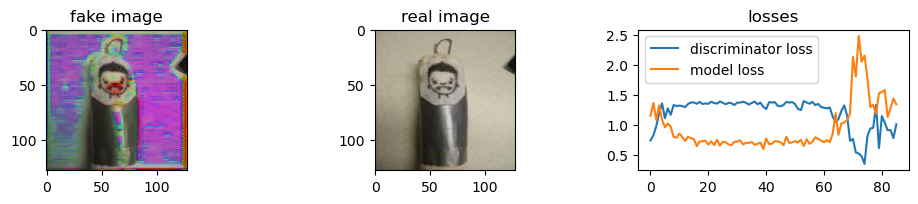

Epoch 86/1000: <==========> ------- disc loss = 1.0978868007659912, model loss = 1.9021953344345093, time = 37.0s
Epoch 87/1000: <==========> ------- disc loss = 0.9164814949035645, model loss = 1.5367575883865356, time = 37.0s
Epoch 88/1000: <==========> ------- disc loss = 0.7852182984352112, model loss = 1.8373386859893799, time = 37.0s
Epoch 89/1000: <==========> ------- disc loss = 0.63368821144104, model loss = 1.9316208362579346, time = 37.0s
Epoch 90/1000: <==========> ------- disc loss = 0.7269582748413086, model loss = 2.2249958515167236, time = 37.0s

Validation loss = 3.081510305404663


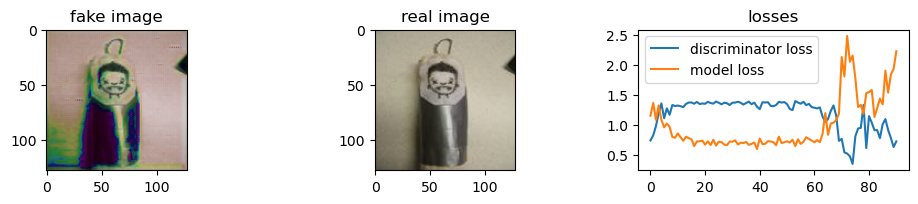

Epoch 91/1000: <==========> ------- disc loss = 0.7896773219108582, model loss = 1.3805376291275024, time = 37.0s
Epoch 92/1000: <==========> ------- disc loss = 0.7389156818389893, model loss = 2.2387661933898926, time = 37.0s
Epoch 93/1000: <==========> ------- disc loss = 0.638760507106781, model loss = 2.3108370304107666, time = 37.0s
Epoch 94/1000: <==========> ------- disc loss = 0.4777289032936096, model loss = 2.206851005554199, time = 37.0s
Epoch 95/1000: <==========> ------- disc loss = 0.3779565691947937, model loss = 3.185685634613037, time = 37.0s

Validation loss = 3.7529149055480957


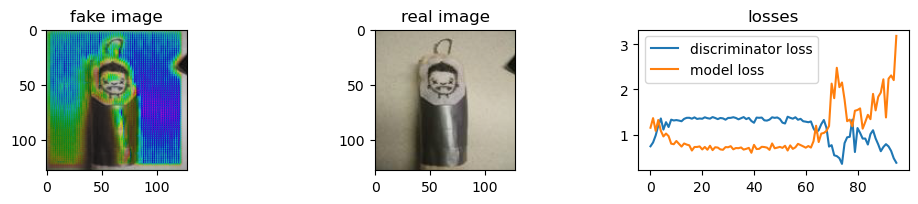

Epoch 96/1000: <==========> ------- disc loss = 0.549666166305542, model loss = 1.9440391063690186, time = 37.0s
Epoch 97/1000: <==========> ------- disc loss = 0.7342036962509155, model loss = 2.4698023796081543, time = 37.0s
Epoch 98/1000: <==========> ------- disc loss = 0.6366806626319885, model loss = 2.0163536071777344, time = 37.0s
Epoch 99/1000: <==========> ------- disc loss = 0.5058782696723938, model loss = 2.2362449169158936, time = 37.0s
Epoch 100/1000: <==========> ------- disc loss = 0.5561505556106567, model loss = 1.8399630784988403, time = 37.0s

Validation loss = 3.058833360671997


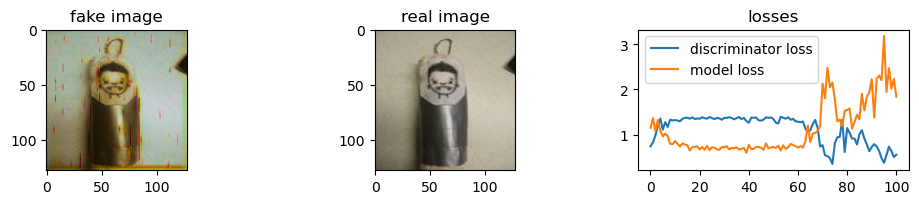

Epoch 101/1000: <==========> ------- disc loss = 0.7089021801948547, model loss = 2.8018481731414795, time = 37.0s
Epoch 102/1000: <==========> ------- disc loss = 0.41594749689102173, model loss = 2.42956805229187, time = 37.0s
Epoch 103/1000: <==========> ------- disc loss = 0.5222716927528381, model loss = 2.7034943103790283, time = 37.0s
Epoch 104/1000: <==========> ------- disc loss = 0.5182837247848511, model loss = 3.3855440616607666, time = 37.0s
Epoch 105/1000: <==========> ------- disc loss = 0.4147031009197235, model loss = 2.5317800045013428, time = 37.0s

Validation loss = 3.074183702468872


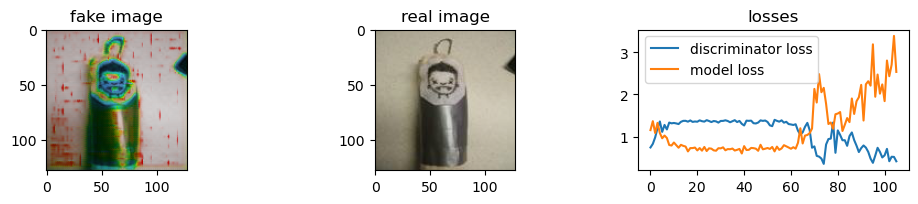

Epoch 106/1000: <==========> ------- disc loss = 0.31251436471939087, model loss = 3.8698108196258545, time = 37.0s
Epoch 107/1000: <==========> ------- disc loss = 0.44713619351387024, model loss = 2.993217706680298, time = 37.0s
Epoch 108/1000: <==========> ------- disc loss = 0.25428441166877747, model loss = 2.8081064224243164, time = 37.0s
Epoch 109/1000: <==========> ------- disc loss = 0.39678943157196045, model loss = 2.8037285804748535, time = 37.0s
Epoch 110/1000: <==========> ------- disc loss = 0.39765095710754395, model loss = 3.5416035652160645, time = 37.0s

Validation loss = 3.320779323577881


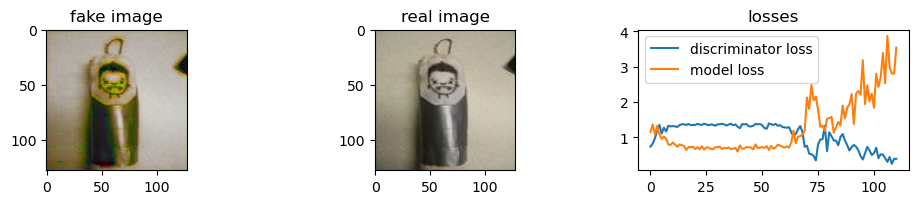

Epoch 111/1000: <==========> ------- disc loss = 0.2338075339794159, model loss = 3.007714033126831, time = 37.0s
Epoch 112/1000: <==========> ------- disc loss = 0.37912824749946594, model loss = 2.7835605144500732, time = 37.0s
Epoch 113/1000: <==========> ------- disc loss = 0.34011995792388916, model loss = 3.313223361968994, time = 37.0s
Epoch 114/1000: <==========> ------- disc loss = 0.3268432021141052, model loss = 2.764420986175537, time = 37.0s
Epoch 115/1000: <==========> ------- disc loss = 0.18410615622997284, model loss = 4.198490619659424, time = 37.0s

Validation loss = 3.0833301544189453


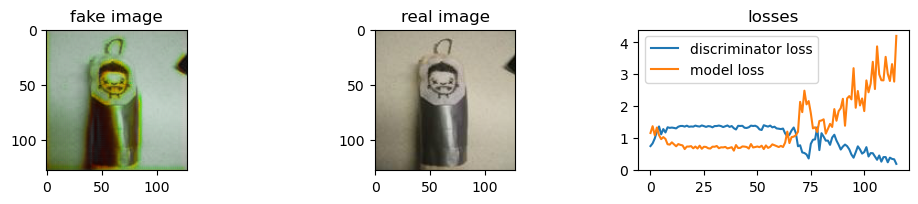

Epoch 116/1000: <==========> ------- disc loss = 0.13454613089561462, model loss = 3.7175822257995605, time = 38.0s
Epoch 117/1000: <==========> ------- disc loss = 0.13928145170211792, model loss = 3.91452956199646, time = 37.0s
Epoch 118/1000: <==========> ------- disc loss = 0.10793635994195938, model loss = 4.308945178985596, time = 37.0s
Epoch 119/1000: <==========> ------- disc loss = 0.02645874209702015, model loss = 4.818972110748291, time = 37.0s
Epoch 120/1000: <==========> ------- disc loss = 0.07887719571590424, model loss = 4.7403388023376465, time = 37.0s

Validation loss = 3.1814942359924316


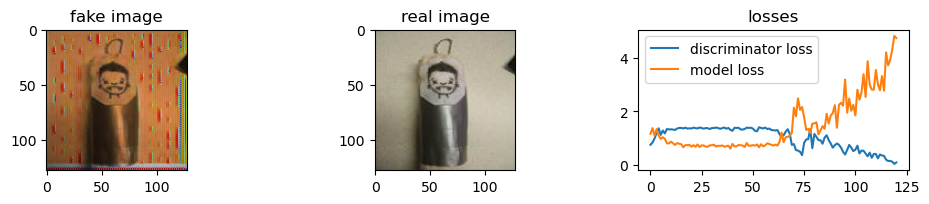

Epoch 121/1000: <==========> ------- disc loss = 0.03919919207692146, model loss = 4.524105548858643, time = 37.0s
Epoch 122/1000: <==========> ------- disc loss = 0.07728217542171478, model loss = 4.68186092376709, time = 37.0s
Epoch 123/1000: <==========> ------- disc loss = 0.036234479397535324, model loss = 4.877856731414795, time = 37.0s
Epoch 124/1000: <==========> ------- disc loss = 0.0313890241086483, model loss = 5.303080081939697, time = 37.0s
Epoch 125/1000: <==========> ------- disc loss = 0.12475501000881195, model loss = 4.731749534606934, time = 37.0s

Validation loss = 3.7421088218688965


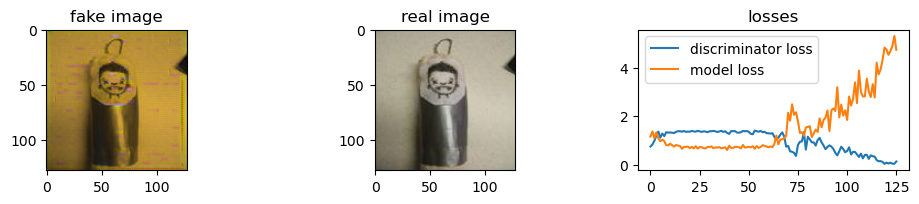

Epoch 126/1000: <==========> ------- disc loss = 0.12825310230255127, model loss = 5.31152868270874, time = 37.0s
Epoch 127/1000: <==========> ------- disc loss = 0.273399293422699, model loss = 3.8870832920074463, time = 37.0s
Epoch 128/1000: <==========> ------- disc loss = 0.2915405035018921, model loss = 4.634522914886475, time = 38.0s
Epoch 129/1000: <==========> ------- disc loss = 0.2229139357805252, model loss = 4.453708171844482, time = 38.0s
Epoch 130/1000: <==========> ------- disc loss = 0.3413121700286865, model loss = 4.8837995529174805, time = 38.0s

Validation loss = 3.2252883911132812


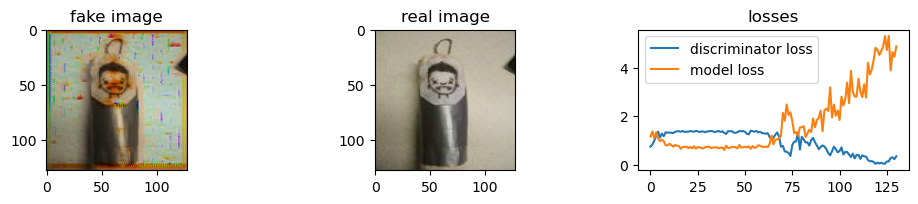

Epoch 131/1000: <==========> ------- disc loss = 0.07940593361854553, model loss = 4.3653564453125, time = 38.0s
Epoch 132/1000: <==========> ------- disc loss = 0.22260649502277374, model loss = 4.795570373535156, time = 38.0s
Epoch 133/1000: <==========> ------- disc loss = 0.28334715962409973, model loss = 5.716491222381592, time = 38.0s
Epoch 134/1000: <==========> ------- disc loss = 0.18300259113311768, model loss = 4.109119892120361, time = 38.0s
Epoch 135/1000: <==========> ------- disc loss = 0.09519487619400024, model loss = 6.127447128295898, time = 38.0s

Validation loss = 3.280900239944458


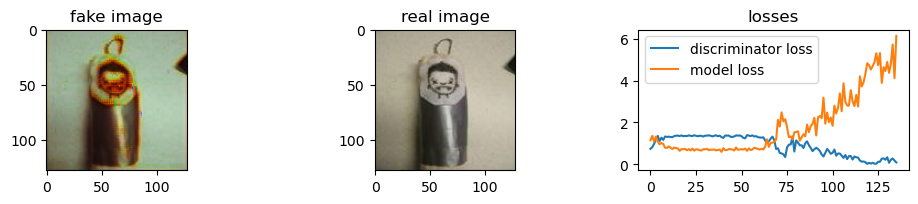

Epoch 136/1000: <==========> ------- disc loss = 0.41953545808792114, model loss = 4.676605701446533, time = 38.0s
Epoch 137/1000: <==========> ------- disc loss = 0.0647035539150238, model loss = 4.926553249359131, time = 38.0s
Epoch 138/1000: <==========> ------- disc loss = 0.2318042516708374, model loss = 4.434555530548096, time = 38.0s
Epoch 139/1000: <==========> ------- disc loss = 0.22346070408821106, model loss = 4.981222152709961, time = 38.0s
Epoch 140/1000: <==========> ------- disc loss = 0.08803603053092957, model loss = 4.8599677085876465, time = 38.0s

Validation loss = 3.695653200149536


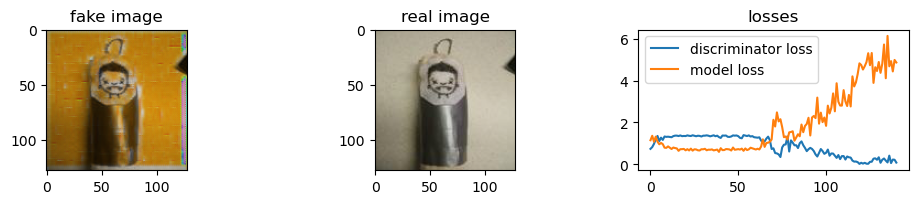

Epoch 141/1000: <==========> ------- disc loss = 0.14371629059314728, model loss = 4.644797325134277, time = 38.0s
Epoch 142/1000: <==========> ------- disc loss = 0.3097662031650543, model loss = 3.582939863204956, time = 38.0s
Epoch 143/1000: <==========> ------- disc loss = 0.21194103360176086, model loss = 4.23583984375, time = 38.0s
Epoch 144/1000: <==========> ------- disc loss = 0.2737334966659546, model loss = 4.635110378265381, time = 38.0s
Epoch 145/1000: <==========> ------- disc loss = 0.04989086091518402, model loss = 5.0265793800354, time = 38.0s

Validation loss = 3.1858625411987305


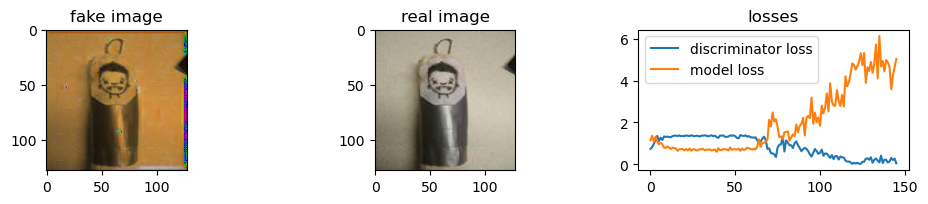

Epoch 146/1000: <==========> ------- disc loss = 0.1647810935974121, model loss = 4.813576698303223, time = 38.0s
Epoch 147/1000: <==========> ------- disc loss = 0.12490865588188171, model loss = 5.1715312004089355, time = 38.0s
Epoch 148/1000: <==========> ------- disc loss = 0.2700105607509613, model loss = 4.958794593811035, time = 38.0s
Epoch 149/1000: <==========> ------- disc loss = 0.10938809812068939, model loss = 4.933756351470947, time = 38.0s
Epoch 150/1000: <==========> ------- disc loss = 0.13857612013816833, model loss = 4.878669261932373, time = 38.0s

Validation loss = 3.672100782394409


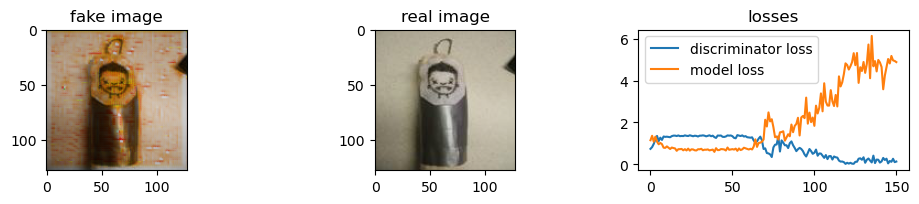

Epoch 151/1000: <==========> ------- disc loss = 0.051603954285383224, model loss = 4.881869316101074, time = 38.0s
Epoch 152/1000: <==========> ------- disc loss = 0.06118953600525856, model loss = 4.722325801849365, time = 38.0s
Epoch 153/1000: <==========> ------- disc loss = 0.07142473012208939, model loss = 5.12019681930542, time = 38.0s
Epoch 154/1000: <==========> ------- disc loss = 0.15605850517749786, model loss = 5.999655246734619, time = 38.0s
Epoch 155/1000: <==========> ------- disc loss = 0.23426899313926697, model loss = 5.237287998199463, time = 38.0s

Validation loss = 3.241614580154419


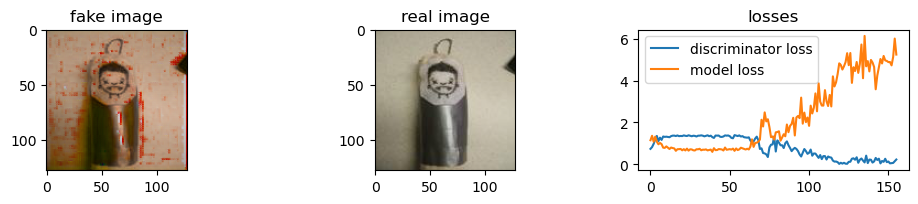

Epoch 156/1000: <==========> ------- disc loss = 0.11300642788410187, model loss = 4.842179298400879, time = 38.0s
Epoch 157/1000: <==========> ------- disc loss = 0.18393352627754211, model loss = 5.8270769119262695, time = 38.0s
Epoch 158/1000: <==========> ------- disc loss = 0.12939956784248352, model loss = 4.939765453338623, time = 38.0s
Epoch 159/1000: <==========> ------- disc loss = 0.1345916986465454, model loss = 5.030780792236328, time = 38.0s
Epoch 160/1000: <==========> ------- disc loss = 0.04893876239657402, model loss = 4.469839572906494, time = 38.0s

Validation loss = 3.489872694015503


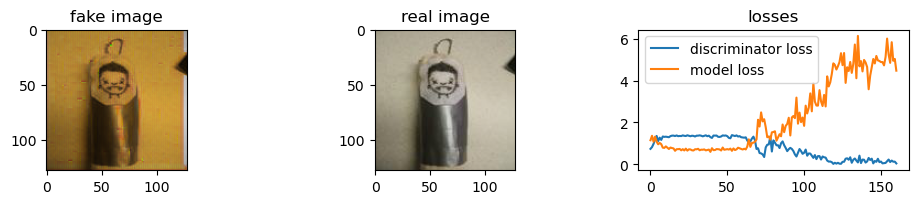

Epoch 161/1000: <==========> ------- disc loss = 0.09446515887975693, model loss = 5.937544822692871, time = 38.0s
Epoch 162/1000: <==========> ------- disc loss = 0.05783146247267723, model loss = 5.484732151031494, time = 38.0s
Epoch 163/1000: <==========> ------- disc loss = 0.1117514818906784, model loss = 6.8775763511657715, time = 38.0s
Epoch 164/1000: <==========> ------- disc loss = 0.09796316176652908, model loss = 5.024619102478027, time = 38.0s
Epoch 165/1000: <==========> ------- disc loss = 0.07911451905965805, model loss = 5.606722831726074, time = 38.0s

Validation loss = 2.9673943519592285


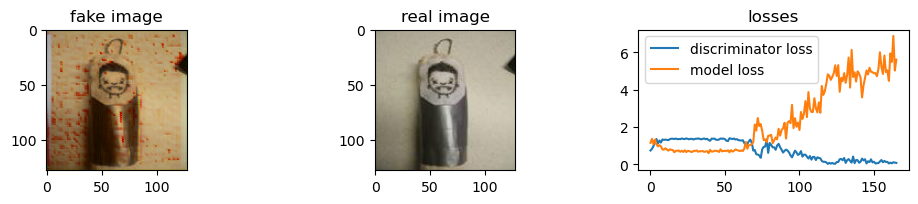

Epoch 166/1000: <==========> ------- disc loss = 0.05091474950313568, model loss = 5.78783655166626, time = 38.0s
Epoch 167/1000: <==========> ------- disc loss = 0.05349734053015709, model loss = 5.033665180206299, time = 38.0s
Epoch 168/1000: <==========> ------- disc loss = 0.03269902989268303, model loss = 6.065529823303223, time = 38.0s
Epoch 169/1000: <==========> ------- disc loss = 0.041858699172735214, model loss = 5.609069347381592, time = 38.0s
Epoch 170/1000: <==========> ------- disc loss = 0.1965562403202057, model loss = 5.42647123336792, time = 38.0s

Validation loss = 3.456146717071533


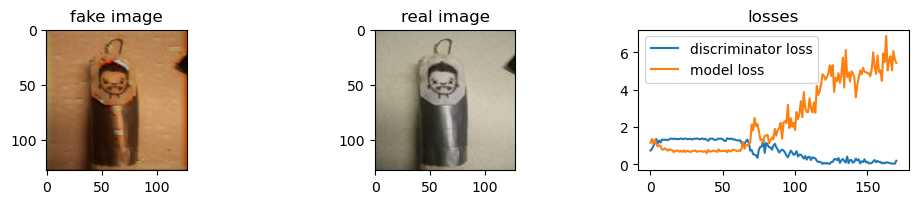

Epoch 171/1000: <==========> ------- disc loss = 0.026904694736003876, model loss = 5.8499836921691895, time = 38.0s
Epoch 172/1000: <==========> ------- disc loss = 0.05277562141418457, model loss = 5.3623270988464355, time = 38.0s
Epoch 173/1000: <==========> ------- disc loss = 0.25479692220687866, model loss = 5.837892055511475, time = 38.0s
Epoch 174/1000: <==========> ------- disc loss = 0.10936683416366577, model loss = 6.8226823806762695, time = 38.0s
Epoch 175/1000: <==========> ------- disc loss = 0.20052510499954224, model loss = 6.016522407531738, time = 38.0s

Validation loss = 3.4141347408294678


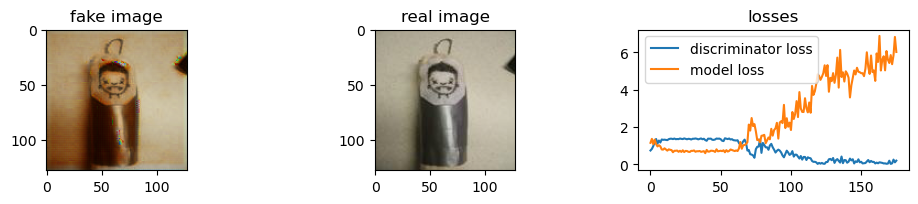

Epoch 176/1000: <==========> ------- disc loss = 0.07512040436267853, model loss = 6.091529369354248, time = 38.0s
Epoch 177/1000: <==========> ------- disc loss = 0.05142807587981224, model loss = 5.904598712921143, time = 38.0s
Epoch 178/1000: <==========> ------- disc loss = 0.13351549208164215, model loss = 5.118039131164551, time = 38.0s
Epoch 179/1000: <==========> ------- disc loss = 0.12316876649856567, model loss = 4.638429164886475, time = 38.0s
Epoch 180/1000: <==========> ------- disc loss = 0.0758894681930542, model loss = 5.617411136627197, time = 38.0s

Validation loss = 3.314919948577881


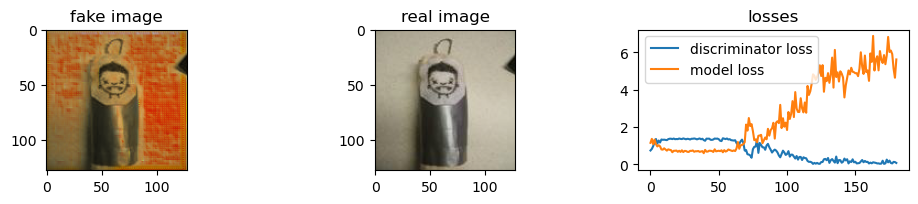

Epoch 181/1000: <==========> ------- disc loss = 0.01751384139060974, model loss = 6.305747985839844, time = 38.0s
Epoch 182/1000: <==========> ------- disc loss = 0.1866997629404068, model loss = 6.405900001525879, time = 38.0s
Epoch 183/1000: <==========> ------- disc loss = 0.062126170843839645, model loss = 5.820375919342041, time = 38.0s
Epoch 184/1000: <==========> ------- disc loss = 0.101152703166008, model loss = 7.056623935699463, time = 38.0s
Epoch 185/1000: <==========> ------- disc loss = 0.09356578439474106, model loss = 6.196412563323975, time = 38.0s

Validation loss = 3.4104108810424805


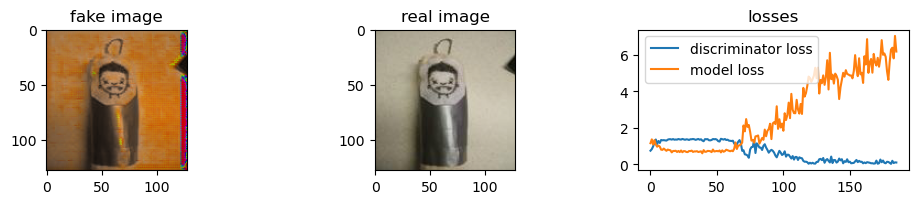

Epoch 186/1000: <==========> ------- disc loss = 0.08909304440021515, model loss = 5.911496162414551, time = 38.0s
Epoch 187/1000: <==========> ------- disc loss = 0.1225365698337555, model loss = 7.717946529388428, time = 38.0s
Epoch 188/1000: <==========> ------- disc loss = 0.021677764132618904, model loss = 6.471446514129639, time = 38.0s
Epoch 189/1000: <==========> ------- disc loss = 0.05935129523277283, model loss = 5.816592693328857, time = 38.0s
Epoch 190/1000: <==========> ------- disc loss = 0.026986543089151382, model loss = 7.322484493255615, time = 38.0s

Validation loss = 3.8493261337280273


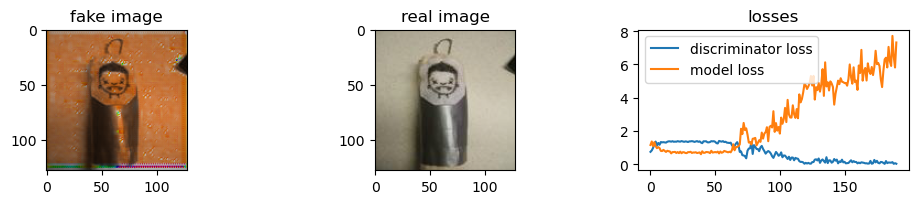

Epoch 191/1000: <==========> ------- disc loss = 0.23735953867435455, model loss = 9.64574146270752, time = 38.0s
Epoch 192/1000: <==========> ------- disc loss = 0.7270308136940002, model loss = 0.7527679800987244, time = 39.0s
Epoch 193/1000: <==========> ------- disc loss = 0.7959284782409668, model loss = 0.7980250120162964, time = 38.0s
Epoch 194/1000: <==========> ------- disc loss = 0.7165672183036804, model loss = 0.8067246079444885, time = 38.0s
Epoch 195/1000: <==========> ------- disc loss = 5.488215446472168, model loss = 0.7106210589408875, time = 39.0s

Validation loss = 4.025481224060059


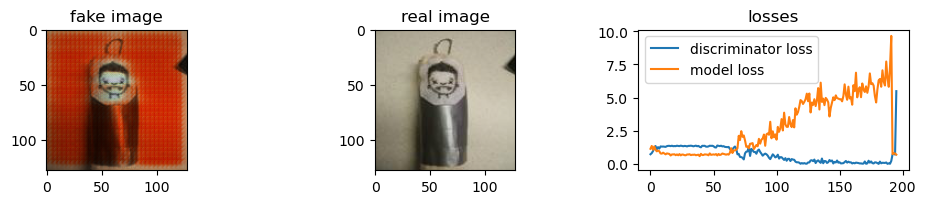

Epoch 196/1000: <==========> ------- disc loss = 1.2449920177459717, model loss = 0.8173733949661255, time = 38.0s
Epoch 197/1000: <==========> ------- disc loss = 1.191786766052246, model loss = 0.7900445461273193, time = 39.0s
Epoch 198/1000: <==========> ------- disc loss = 1.0085012912750244, model loss = 0.8210391998291016, time = 39.0s
Epoch 199/1000: <==========> ------- disc loss = 0.8976131677627563, model loss = 0.8269382119178772, time = 38.0s
Epoch 200/1000: <==========> ------- disc loss = 0.8222240209579468, model loss = 0.8337165117263794, time = 38.0s

Validation loss = 3.4350080490112305


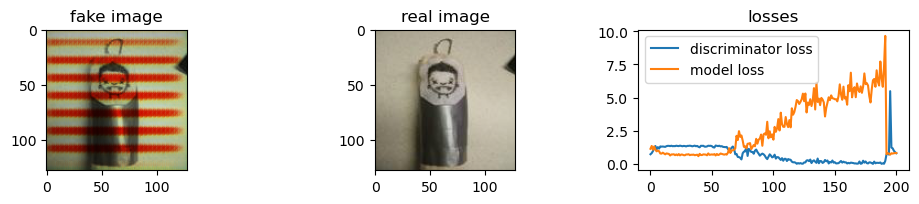

Epoch 201/1000: <==========> ------- disc loss = 0.6264892220497131, model loss = 0.8416749835014343, time = 38.0s
Epoch 202/1000: <==========> ------- disc loss = 0.6744484901428223, model loss = 0.8499324321746826, time = 38.0s
Epoch 203/1000: <==========> ------- disc loss = 0.6503109931945801, model loss = 0.8580990433692932, time = 38.0s
Epoch 204/1000: <==========> ------- disc loss = 1.0693538188934326, model loss = 0.8630509376525879, time = 38.0s
Epoch 205/1000: <==========> ------- disc loss = 0.821250855922699, model loss = 0.8670318126678467, time = 38.0s

Validation loss = 3.6339633464813232


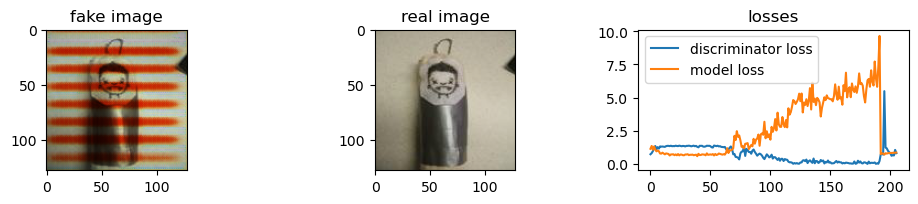

Epoch 206/1000: <==========> ------- disc loss = 0.6709744930267334, model loss = 0.873507022857666, time = 38.0s
Epoch 207/1000: <==========> ------- disc loss = 0.9151607751846313, model loss = 0.8802137970924377, time = 38.0s
Epoch 208/1000: <==========> ------- disc loss = 0.9311275482177734, model loss = 0.883309006690979, time = 38.0s
Epoch 209/1000: <==========> ------- disc loss = 0.725184440612793, model loss = 0.8880193829536438, time = 38.0s
Epoch 210/1000: <==========> ------- disc loss = 0.6787439584732056, model loss = 0.8935538530349731, time = 38.0s

Validation loss = 3.6649863719940186


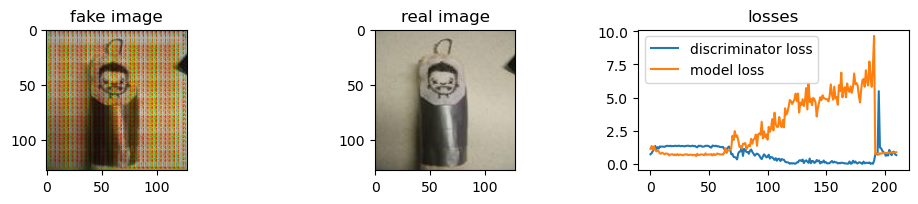

Epoch 211/1000: <==========> ------- disc loss = 0.6613621711730957, model loss = 0.8994566798210144, time = 38.0s
Epoch 212/1000: <==========> ------- disc loss = 0.6021279692649841, model loss = 0.9056223630905151, time = 38.0s
Epoch 213/1000: <==========> ------- disc loss = 0.9575755000114441, model loss = 0.8925689458847046, time = 38.0s
Epoch 214/1000: <==========> ------- disc loss = 1.1431527137756348, model loss = 0.9140252470970154, time = 38.0s
Epoch 215/1000: <==========> ------- disc loss = 0.8085784316062927, model loss = 0.8943009972572327, time = 38.0s

Validation loss = 3.3684685230255127


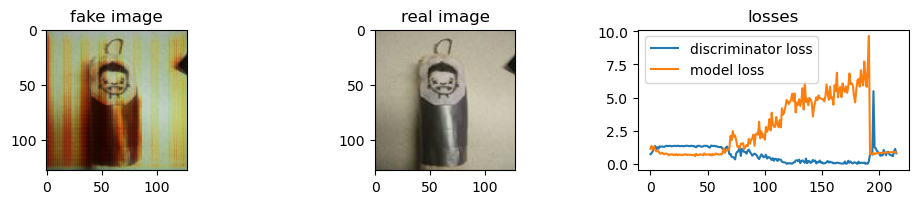

Epoch 216/1000: <==========> ------- disc loss = 1.357427716255188, model loss = 0.9132044315338135, time = 39.0s
Epoch 217/1000: <==========> ------- disc loss = 1.3787579536437988, model loss = 0.9140031337738037, time = 38.0s
Epoch 218/1000: <==========> ------- disc loss = 1.4250775575637817, model loss = 0.9100646376609802, time = 38.0s
Epoch 219/1000: <==========> ------- disc loss = 1.423829436302185, model loss = 0.9062162637710571, time = 38.0s
Epoch 220/1000: <==========> ------- disc loss = 1.4055907726287842, model loss = 0.9024328589439392, time = 38.0s

Validation loss = 3.4152095317840576


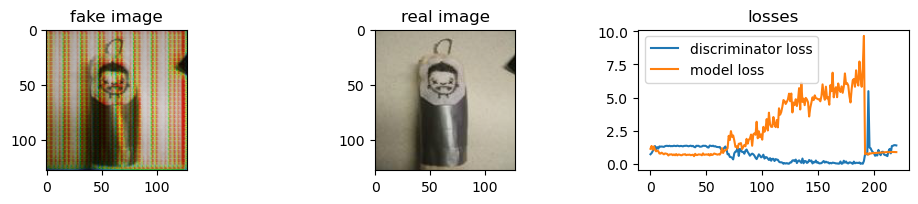

Epoch 221/1000: <==========> ------- disc loss = 1.3340654373168945, model loss = 0.8988053202629089, time = 38.0s
Epoch 222/1000: <==========> ------- disc loss = 1.1559183597564697, model loss = 0.8977005481719971, time = 38.0s
Epoch 223/1000: <==========> ------- disc loss = 0.8875385522842407, model loss = 0.8992586731910706, time = 38.0s
Epoch 224/1000: <==========> ------- disc loss = 1.0111572742462158, model loss = 0.9019750952720642, time = 38.0s
Epoch 225/1000: <==========> ------- disc loss = 0.7396267652511597, model loss = 0.9057915210723877, time = 38.0s

Validation loss = 3.402139663696289


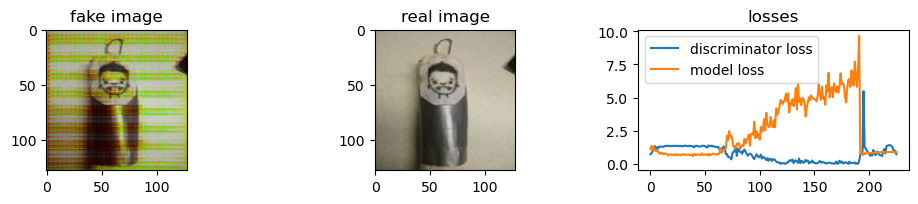

Epoch 226/1000: <==========> ------- disc loss = 0.8062483072280884, model loss = 0.9109413623809814, time = 38.0s
Epoch 227/1000: <==========> ------- disc loss = 1.5521440505981445, model loss = 0.8819193840026855, time = 39.0s
Epoch 228/1000: <==========> ------- disc loss = 1.3439433574676514, model loss = 0.9118735790252686, time = 38.0s
Epoch 229/1000: <==========> ------- disc loss = 1.1664106845855713, model loss = 0.9095696806907654, time = 38.0s
Epoch 230/1000: <==========> ------- disc loss = 0.8299983739852905, model loss = 0.9125985503196716, time = 38.0s

Validation loss = 3.923119068145752


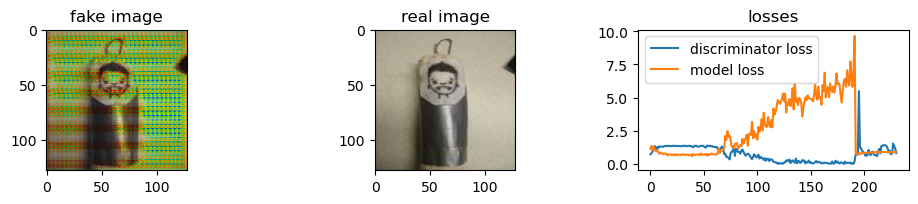

Epoch 231/1000: <==========> ------- disc loss = 1.4211004972457886, model loss = 0.8000102639198303, time = 39.0s
Epoch 232/1000: <==========> ------- disc loss = 1.4364562034606934, model loss = 0.8597819805145264, time = 39.0s
Epoch 233/1000: <==========> ------- disc loss = 1.3484535217285156, model loss = 0.911254346370697, time = 38.0s
Epoch 234/1000: <==========> ------- disc loss = 1.019775629043579, model loss = 0.9082361459732056, time = 38.0s
Epoch 235/1000: <==========> ------- disc loss = 1.1432154178619385, model loss = 0.8656297922134399, time = 38.0s

Validation loss = 3.7052536010742188


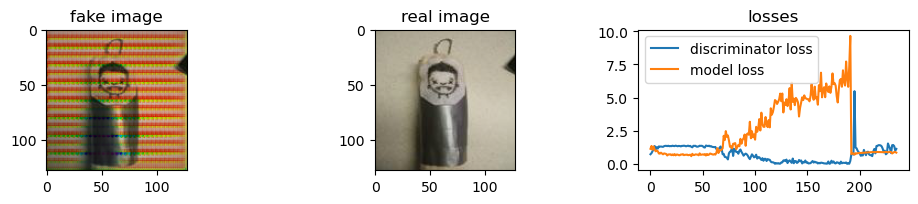

Epoch 236/1000: <==========> ------- disc loss = 1.6004102230072021, model loss = 0.7263481616973877, time = 39.0s
Epoch 237/1000: <==========> ------- disc loss = 1.3496966361999512, model loss = 0.9089105129241943, time = 38.0s
Epoch 238/1000: <==========> ------- disc loss = 1.0406004190444946, model loss = 0.9073947072029114, time = 38.0s
Epoch 239/1000: <==========> ------- disc loss = 1.4382402896881104, model loss = 0.8889089822769165, time = 39.0s
Epoch 240/1000: <==========> ------- disc loss = 1.411239504814148, model loss = 0.8802721500396729, time = 39.0s

Validation loss = 4.245675563812256


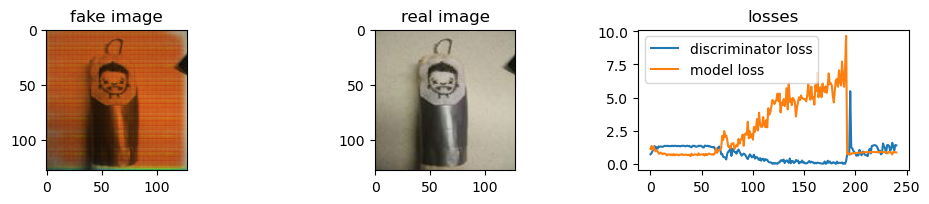

Epoch 241/1000: <==========> ------- disc loss = 1.4010727405548096, model loss = 0.8954634070396423, time = 38.0s
Epoch 242/1000: <==========> ------- disc loss = 1.390822172164917, model loss = 0.8904757499694824, time = 38.0s
Epoch 243/1000: <==========> ------- disc loss = 1.3507390022277832, model loss = 0.8857297301292419, time = 37.0s
Epoch 244/1000: <==========> ------- disc loss = 1.3913832902908325, model loss = 0.8812527060508728, time = 37.0s
Epoch 245/1000: <==========> ------- disc loss = 1.4662199020385742, model loss = 0.8540937304496765, time = 38.0s

Validation loss = 3.7467312812805176


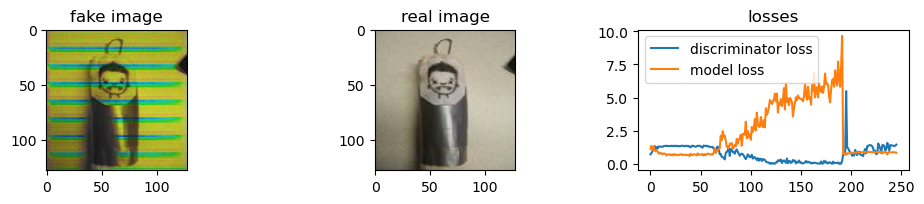

Epoch 246/1000: <==========> ------- disc loss = 1.3858113288879395, model loss = 0.8436573147773743, time = 38.0s
Epoch 247/1000: <==========> ------- disc loss = 1.1727375984191895, model loss = 0.8555737137794495, time = 39.0s
Epoch 248/1000: <==========> ------- disc loss = 1.4510855674743652, model loss = 0.7800650596618652, time = 39.0s
Epoch 249/1000: <==========> ------- disc loss = 1.3799582719802856, model loss = 0.8695386648178101, time = 38.0s
Epoch 250/1000: <==========> ------- disc loss = 1.0442379713058472, model loss = 0.8667266368865967, time = 38.0s

Validation loss = 3.511413097381592


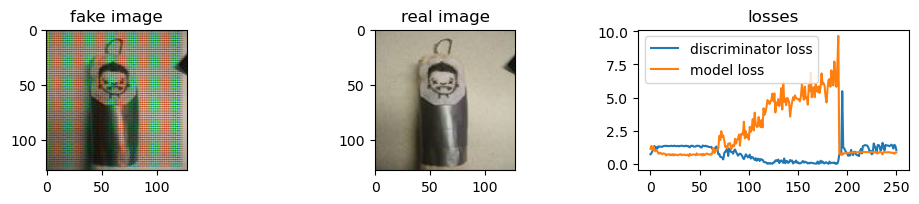

Epoch 251/1000: <==========> ------- disc loss = 1.3831310272216797, model loss = 0.8395352959632874, time = 39.0s
Epoch 252/1000: <==========> ------- disc loss = 1.423248291015625, model loss = 0.84881192445755, time = 39.0s
Epoch 253/1000: <==========> ------- disc loss = 1.3442745208740234, model loss = 0.8626808524131775, time = 38.0s
Epoch 254/1000: <==========> ------- disc loss = 1.121190071105957, model loss = 0.859509289264679, time = 38.0s
Epoch 255/1000: <==========> ------- disc loss = 1.20524001121521, model loss = 0.8556402921676636, time = 38.0s

Validation loss = 3.1582016944885254


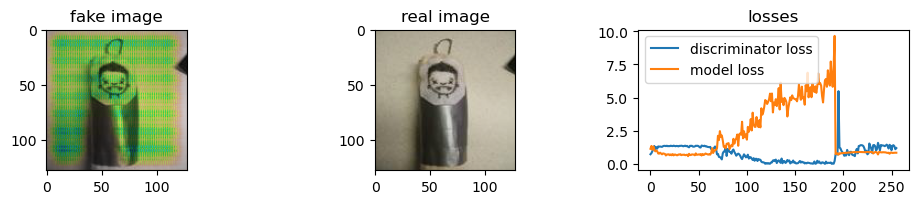

Epoch 256/1000: <==========> ------- disc loss = 1.4239609241485596, model loss = 0.7595651149749756, time = 38.0s
Epoch 257/1000: <==========> ------- disc loss = 1.4315452575683594, model loss = 0.8181759715080261, time = 39.0s
Epoch 258/1000: <==========> ------- disc loss = 1.3263673782348633, model loss = 0.8608999848365784, time = 38.0s
Epoch 259/1000: <==========> ------- disc loss = 1.1569921970367432, model loss = 0.8577606081962585, time = 38.0s
Epoch 260/1000: <==========> ------- disc loss = 1.4290645122528076, model loss = 0.8381903171539307, time = 39.0s

Validation loss = 3.0359015464782715


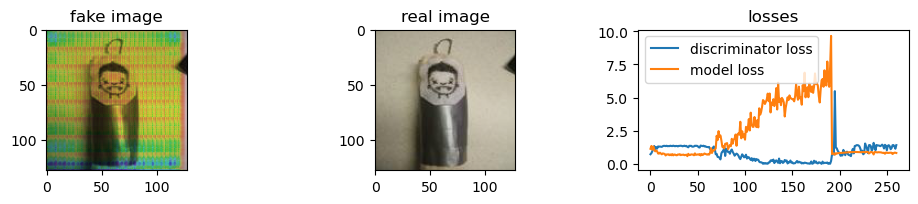

Epoch 261/1000: <==========> ------- disc loss = 1.395121693611145, model loss = 0.8542823791503906, time = 38.0s
Epoch 262/1000: <==========> ------- disc loss = 1.3089706897735596, model loss = 0.8496321439743042, time = 38.0s
Epoch 263/1000: <==========> ------- disc loss = 1.4243099689483643, model loss = 0.7201554775238037, time = 38.0s
Epoch 264/1000: <==========> ------- disc loss = 1.3551374673843384, model loss = 0.846760094165802, time = 39.0s
Epoch 265/1000: <==========> ------- disc loss = 1.3731389045715332, model loss = 0.8422276377677917, time = 38.0s

Validation loss = 3.1132030487060547


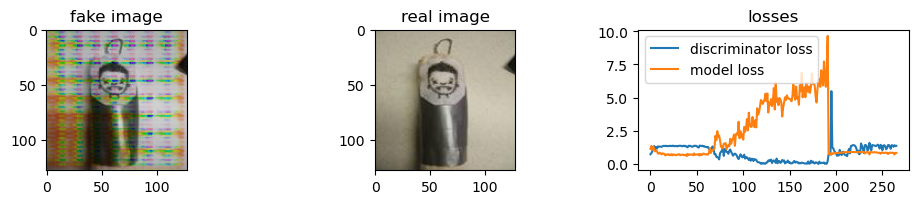

Epoch 266/1000: <==========> ------- disc loss = 1.2735782861709595, model loss = 0.8384312391281128, time = 38.0s
Epoch 267/1000: <==========> ------- disc loss = 1.5864410400390625, model loss = 0.6460162401199341, time = 38.0s
Epoch 268/1000: <==========> ------- disc loss = 1.4290053844451904, model loss = 0.8044249415397644, time = 39.0s
Epoch 269/1000: <==========> ------- disc loss = 1.3997366428375244, model loss = 0.8359246850013733, time = 38.0s
Epoch 270/1000: <==========> ------- disc loss = 1.3402795791625977, model loss = 0.8313577175140381, time = 38.0s

Validation loss = 3.2914085388183594


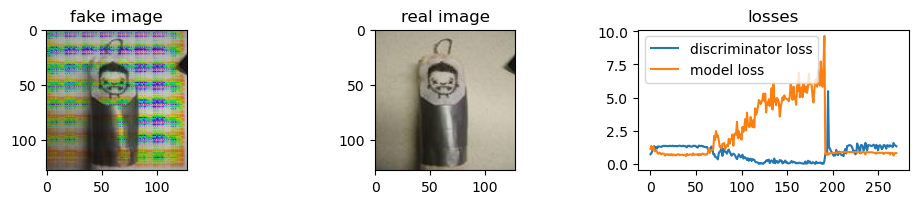

Epoch 271/1000: <==========> ------- disc loss = 1.2893234491348267, model loss = 0.827528178691864, time = 38.0s
Epoch 272/1000: <==========> ------- disc loss = 1.162360429763794, model loss = 0.823515772819519, time = 38.0s
Epoch 273/1000: <==========> ------- disc loss = 1.371065616607666, model loss = 0.7922329306602478, time = 39.0s
Epoch 274/1000: <==========> ------- disc loss = 1.391925573348999, model loss = 0.8214812278747559, time = 39.0s
Epoch 275/1000: <==========> ------- disc loss = 1.371762752532959, model loss = 0.8240047097206116, time = 38.0s

Validation loss = 3.497400999069214


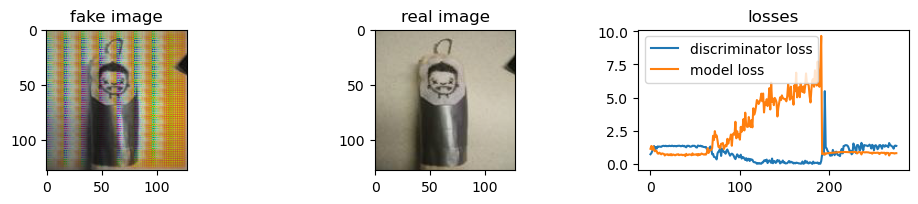

Epoch 276/1000: <==========> ------- disc loss = 1.3613882064819336, model loss = 0.8196722865104675, time = 38.0s
Epoch 277/1000: <==========> ------- disc loss = 1.2267800569534302, model loss = 0.7537915110588074, time = 38.0s
Epoch 278/1000: <==========> ------- disc loss = 1.463321566581726, model loss = 0.7511623501777649, time = 39.0s
Epoch 279/1000: <==========> ------- disc loss = 1.3673980236053467, model loss = 0.8128563165664673, time = 38.0s
Epoch 280/1000: <==========> ------- disc loss = 1.3523375988006592, model loss = 0.808706521987915, time = 38.0s

Validation loss = 3.108699321746826


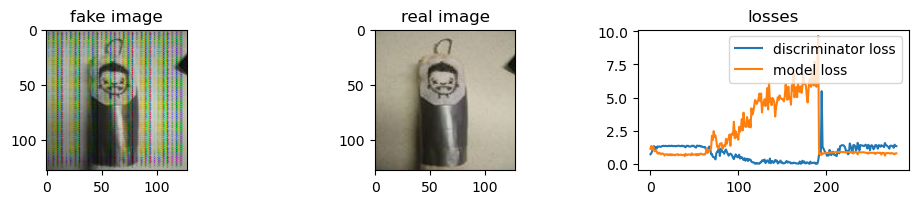

Epoch 281/1000: <==========> ------- disc loss = 1.312901496887207, model loss = 0.6993093490600586, time = 38.0s
Epoch 282/1000: <==========> ------- disc loss = 1.361727237701416, model loss = 0.8026785254478455, time = 39.0s
Epoch 283/1000: <==========> ------- disc loss = 1.3958163261413574, model loss = 0.8050898313522339, time = 38.0s
Epoch 284/1000: <==========> ------- disc loss = 1.3523292541503906, model loss = 0.8011707663536072, time = 38.0s
Epoch 285/1000: <==========> ------- disc loss = 1.3529000282287598, model loss = 0.7976459264755249, time = 38.0s

Validation loss = 3.0795161724090576


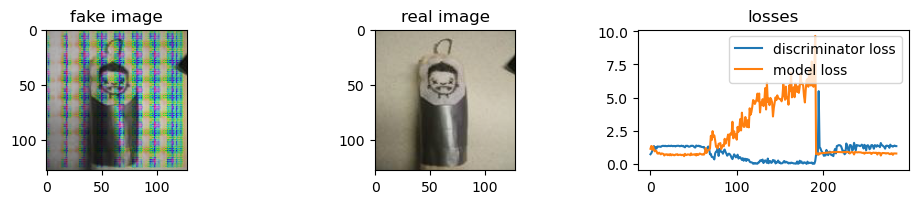

Epoch 286/1000: <==========> ------- disc loss = 1.2307310104370117, model loss = 0.7949618101119995, time = 38.0s
Epoch 287/1000: <==========> ------- disc loss = 1.4255821704864502, model loss = 0.7689735889434814, time = 39.0s
Epoch 288/1000: <==========> ------- disc loss = 1.3953256607055664, model loss = 0.7927156686782837, time = 38.0s
Epoch 289/1000: <==========> ------- disc loss = 1.3945863246917725, model loss = 0.7883666753768921, time = 38.0s
Epoch 290/1000: <==========> ------- disc loss = 1.3939028978347778, model loss = 0.7841852903366089, time = 37.0s

Validation loss = 2.7503368854522705


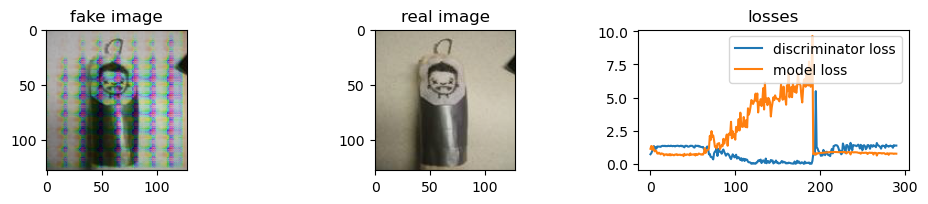

Epoch 291/1000: <==========> ------- disc loss = 1.3932697772979736, model loss = 0.7801562547683716, time = 37.0s
Epoch 292/1000: <==========> ------- disc loss = 1.3926830291748047, model loss = 0.7762677073478699, time = 37.0s
Epoch 293/1000: <==========> ------- disc loss = 1.3921383619308472, model loss = 0.7725090384483337, time = 37.0s
Epoch 294/1000: <==========> ------- disc loss = 1.3916329145431519, model loss = 0.7688718438148499, time = 37.0s
Epoch 295/1000: <==========> ------- disc loss = 1.3911635875701904, model loss = 0.7653487920761108, time = 37.0s

Validation loss = 2.7350611686706543


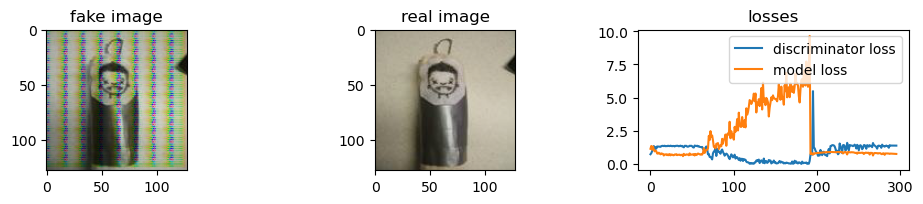

Epoch 296/1000: <==========> ------- disc loss = 1.3907279968261719, model loss = 0.7619341611862183, time = 37.0s
Epoch 297/1000: <==========> ------- disc loss = 1.3903238773345947, model loss = 0.7586228251457214, time = 37.0s
Epoch 298/1000: <==========> ------- disc loss = 1.389949083328247, model loss = 0.7554105520248413, time = 37.0s
Epoch 299/1000: <==========> ------- disc loss = 1.3896021842956543, model loss = 0.752293586730957, time = 37.0s
Epoch 300/1000: <==========> ------- disc loss = 1.3892810344696045, model loss = 0.7492690086364746, time = 37.0s

Validation loss = 2.760572910308838


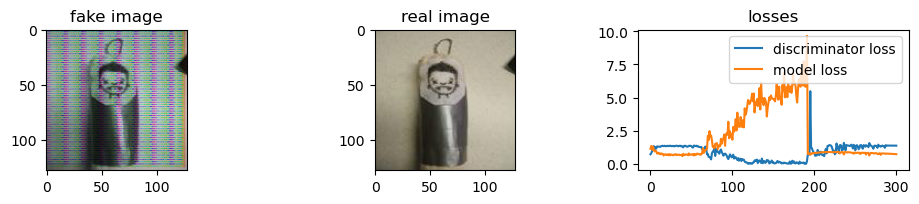

Epoch 301/1000: <==========> ------- disc loss = 1.3889844417572021, model loss = 0.7463346123695374, time = 37.0s
Epoch 302/1000: <==========> ------- disc loss = 1.388710618019104, model loss = 0.7434881329536438, time = 37.0s
Epoch 303/1000: <==========> ------- disc loss = 1.3884586095809937, model loss = 0.7407277226448059, time = 37.0s
Epoch 304/1000: <==========> ------- disc loss = 1.3882272243499756, model loss = 0.7380523681640625, time = 37.0s
Epoch 305/1000: <==========> ------- disc loss = 1.3880149126052856, model loss = 0.7354608178138733, time = 37.0s

Validation loss = 2.7042858600616455


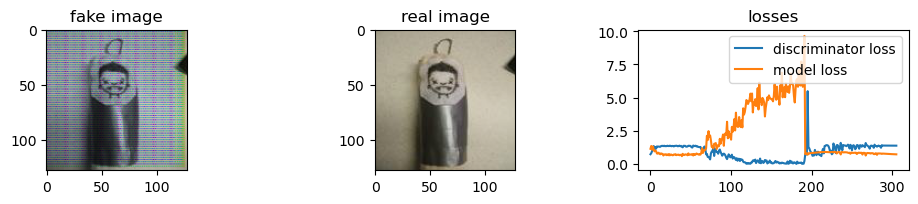

Epoch 306/1000: <==========> ------- disc loss = 1.3878206014633179, model loss = 0.732952356338501, time = 37.0s
Epoch 307/1000: <==========> ------- disc loss = 1.3876433372497559, model loss = 0.7305262088775635, time = 37.0s
Epoch 308/1000: <==========> ------- disc loss = 1.3874821662902832, model loss = 0.7281806468963623, time = 37.0s
Epoch 309/1000: <==========> ------- disc loss = 1.387336015701294, model loss = 0.7259178161621094, time = 37.0s
Epoch 310/1000: <==========> ------- disc loss = 1.3872039318084717, model loss = 0.723737359046936, time = 37.0s

Validation loss = 2.5448107719421387


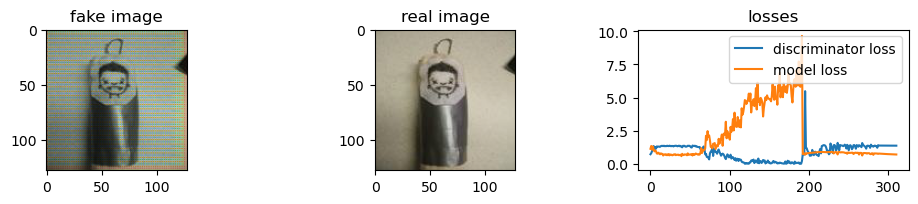

Epoch 311/1000: <==========> ------- disc loss = 1.3870850801467896, model loss = 0.7216385006904602, time = 37.0s
Epoch 312/1000: <==========> ------- disc loss = 1.3869783878326416, model loss = 0.7196211814880371, time = 37.0s
Epoch 313/1000: <==========> ------- disc loss = 1.38688325881958, model loss = 0.7176856398582458, time = 37.0s
Epoch 314/1000: <==========> ------- disc loss = 1.3867985010147095, model loss = 0.7158319354057312, time = 37.0s
Epoch 315/1000: <==========> ------- disc loss = 1.3867237567901611, model loss = 0.7140599489212036, time = 37.0s

Validation loss = 2.4450018405914307


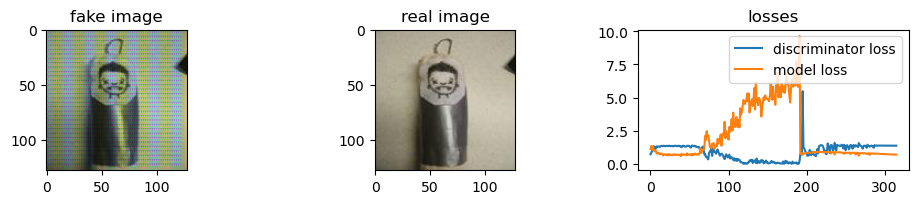

Epoch 316/1000: <==========> ------- disc loss = 1.38665771484375, model loss = 0.7123701572418213, time = 37.0s
Epoch 317/1000: <==========> ------- disc loss = 1.3865998983383179, model loss = 0.7107622027397156, time = 37.0s
Epoch 318/1000: <==========> ------- disc loss = 1.386549711227417, model loss = 0.709236204624176, time = 37.0s
Epoch 319/1000: <==========> ------- disc loss = 1.386506199836731, model loss = 0.707791805267334, time = 37.0s
Epoch 320/1000: <==========> ------- disc loss = 1.3864688873291016, model loss = 0.7064288258552551, time = 37.0s

Validation loss = 2.355705738067627


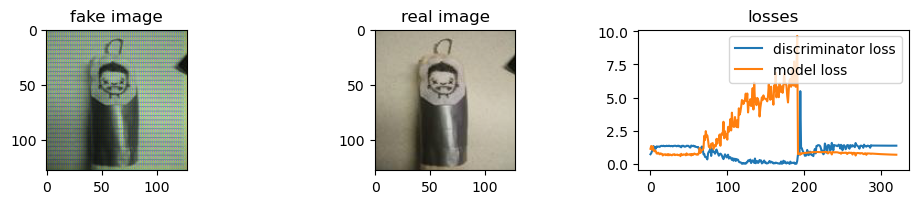

Epoch 321/1000: <==========> ------- disc loss = 1.3864370584487915, model loss = 0.7051467299461365, time = 37.0s
Epoch 322/1000: <==========> ------- disc loss = 1.3864099979400635, model loss = 0.7039448618888855, time = 37.0s
Epoch 323/1000: <==========> ------- disc loss = 1.3863873481750488, model loss = 0.7028222680091858, time = 37.0s
Epoch 324/1000: <==========> ------- disc loss = 1.3863685131072998, model loss = 0.7017776370048523, time = 37.0s
Epoch 325/1000: <==========> ------- disc loss = 1.386352777481079, model loss = 0.7008098363876343, time = 37.0s

Validation loss = 2.294612169265747


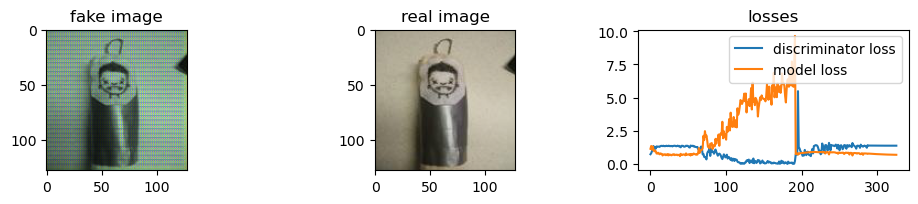

Epoch 326/1000: <==========> ------- disc loss = 1.3863401412963867, model loss = 0.6999170780181885, time = 37.0s
Epoch 327/1000: <==========> ------- disc loss = 1.3863296508789062, model loss = 0.6990972757339478, time = 37.0s
Epoch 328/1000: <==========> ------- disc loss = 1.3863215446472168, model loss = 0.698348343372345, time = 37.0s
Epoch 329/1000: <==========> ------- disc loss = 1.386314868927002, model loss = 0.6976677179336548, time = 37.0s
Epoch 330/1000: <==========> ------- disc loss = 1.3863096237182617, model loss = 0.6970527172088623, time = 37.0s

Validation loss = 2.265446424484253


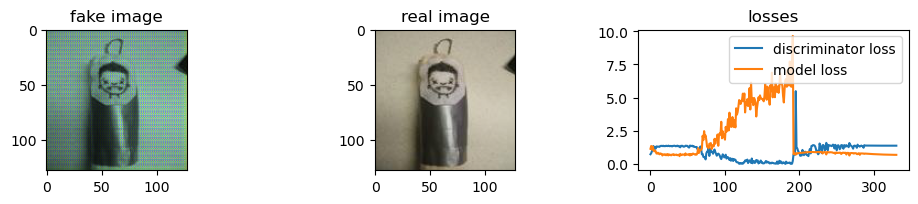

Epoch 331/1000: <==========> ------- disc loss = 1.386305570602417, model loss = 0.6965001225471497, time = 37.0s
Epoch 332/1000: <==========> ------- disc loss = 1.3863025903701782, model loss = 0.6960067749023438, time = 37.0s
Epoch 333/1000: <==========> ------- disc loss = 1.3863002061843872, model loss = 0.6955692172050476, time = 37.0s
Epoch 334/1000: <==========> ------- disc loss = 1.386298656463623, model loss = 0.6951836943626404, time = 37.0s
Epoch 335/1000: <==========> ------- disc loss = 1.3862972259521484, model loss = 0.6948466897010803, time = 37.0s

Validation loss = 2.2519376277923584


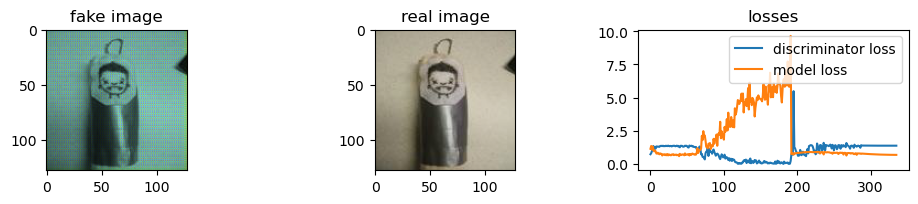

Epoch 336/1000: <==========> ------- disc loss = 1.3862965106964111, model loss = 0.6945540904998779, time = 37.0s
Epoch 337/1000: <==========> ------- disc loss = 1.3862956762313843, model loss = 0.6943022608757019, time = 37.0s
Epoch 338/1000: <==========> ------- disc loss = 1.386295199394226, model loss = 0.6940872669219971, time = 37.0s
Epoch 339/1000: <==========> ------- disc loss = 1.3862950801849365, model loss = 0.6939052939414978, time = 37.0s
Epoch 340/1000: <==========> ------- disc loss = 1.3862948417663574, model loss = 0.6937528252601624, time = 37.0s

Validation loss = 2.2587292194366455


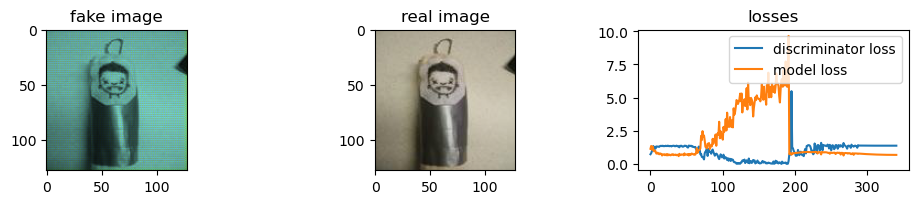

Epoch 341/1000: <==========> ------- disc loss = 1.3862946033477783, model loss = 0.6936260461807251, time = 37.0s
Epoch 342/1000: <==========> ------- disc loss = 1.3862944841384888, model loss = 0.693522036075592, time = 37.0s
Epoch 343/1000: <==========> ------- disc loss = 1.3862944841384888, model loss = 0.6934373378753662, time = 37.0s
Epoch 344/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6933691501617432, time = 37.0s
Epoch 345/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6933150291442871, time = 37.0s

Validation loss = 2.2759594917297363


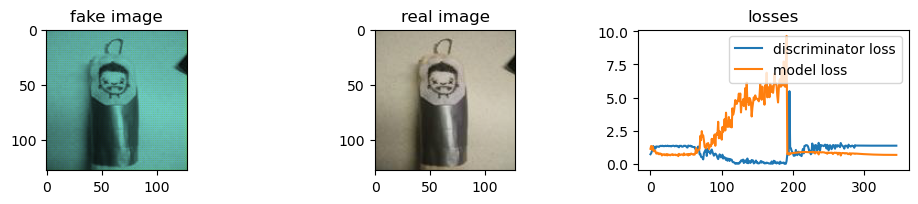

Epoch 346/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.693272590637207, time = 37.0s
Epoch 347/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6932396292686462, time = 37.0s
Epoch 348/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6932144165039062, time = 37.0s
Epoch 349/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931953430175781, time = 37.0s
Epoch 350/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931811571121216, time = 37.0s

Validation loss = 2.3095858097076416


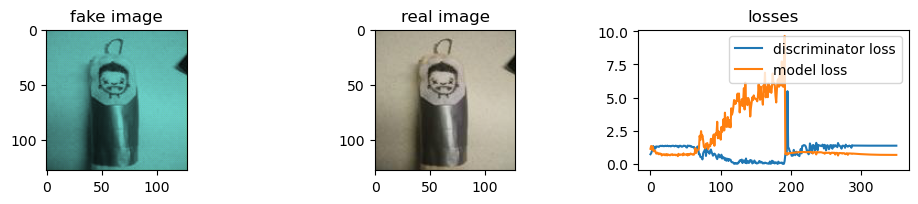

Epoch 351/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931707859039307, time = 37.0s
Epoch 352/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931633949279785, time = 37.0s
Epoch 353/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.693157970905304, time = 37.0s
Epoch 354/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931543350219727, time = 37.0s
Epoch 355/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931517124176025, time = 37.0s

Validation loss = 2.3430991172790527


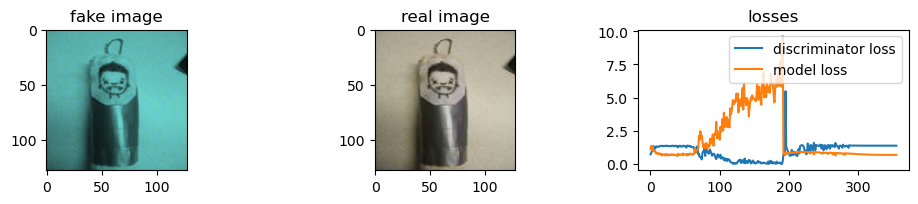

Epoch 356/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931501030921936, time = 37.0s
Epoch 357/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931490302085876, time = 37.0s
Epoch 358/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931482553482056, time = 37.0s
Epoch 359/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931478977203369, time = 37.0s
Epoch 360/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931476593017578, time = 37.0s

Validation loss = 2.381119966506958


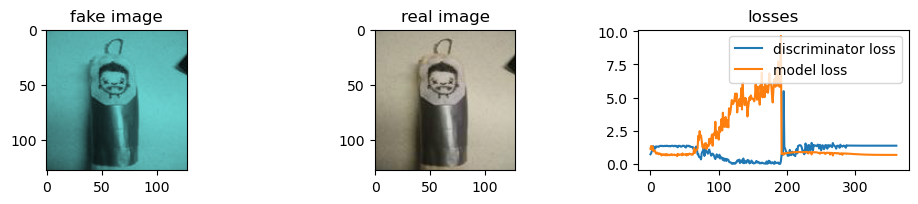

Epoch 361/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931474208831787, time = 37.0s
Epoch 362/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931473612785339, time = 37.0s
Epoch 363/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 364/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 365/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3886313438415527


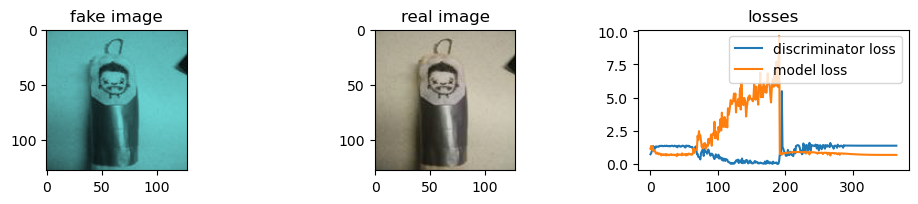

Epoch 366/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 367/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 368/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 369/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 370/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3940250873565674


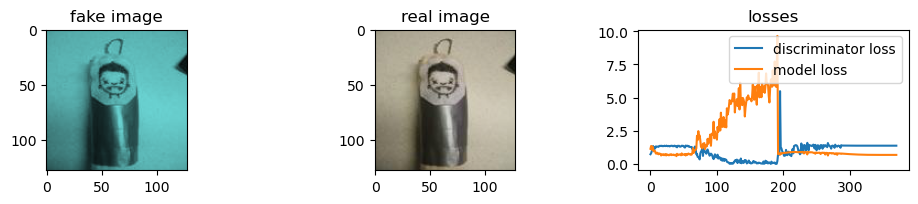

Epoch 371/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 372/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 373/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 374/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 375/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.392206907272339


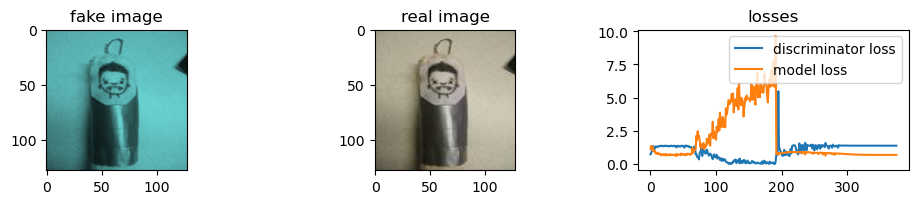

Epoch 376/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 377/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 378/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 379/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 380/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3978264331817627


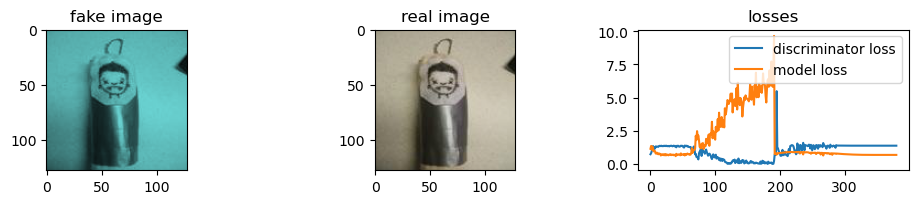

Epoch 381/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 382/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 383/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 384/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 385/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.398284673690796


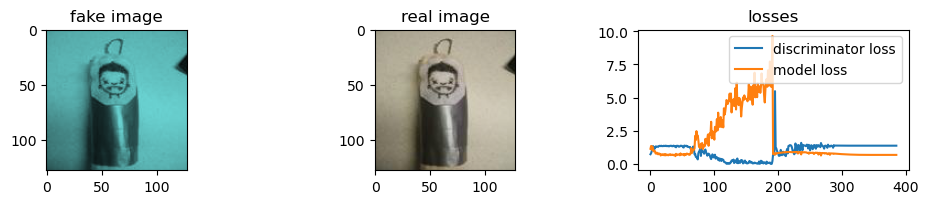

Epoch 386/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 387/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 388/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 389/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 390/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.400890827178955


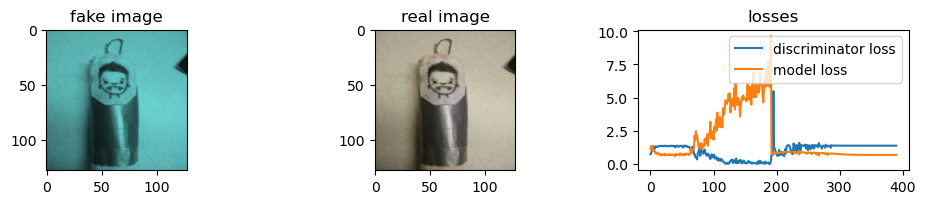

Epoch 391/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 392/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 393/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 394/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 395/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3948609828948975


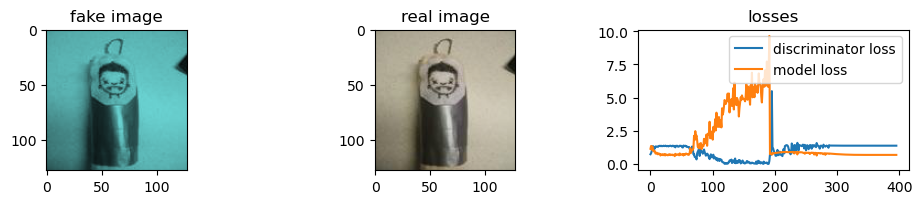

Epoch 396/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 397/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 398/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 399/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 400/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.397162914276123


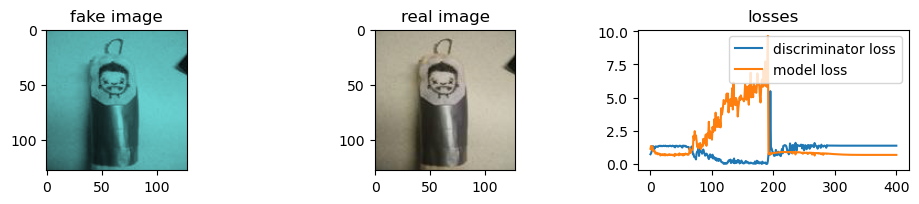

Epoch 401/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 402/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 403/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 404/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 405/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.4031009674072266


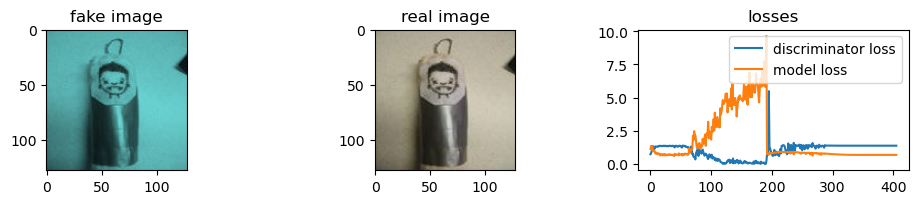

Epoch 406/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 407/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 408/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 409/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 410/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.4032349586486816


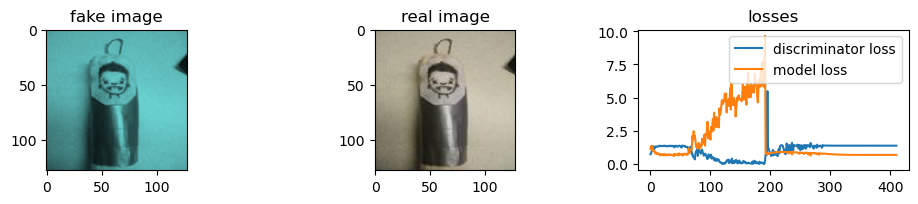

Epoch 411/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 412/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 413/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 414/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 415/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.399979591369629


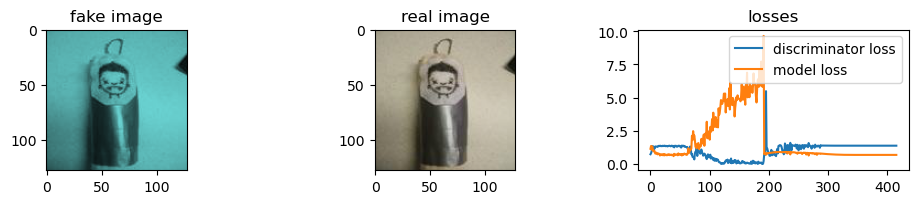

Epoch 416/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 417/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 418/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 419/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 420/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.400576591491699


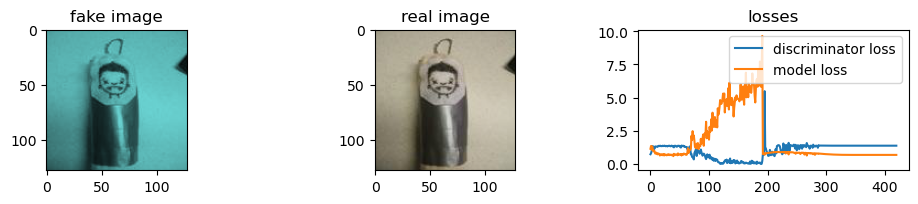

Epoch 421/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 422/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 423/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 424/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 425/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.4016194343566895


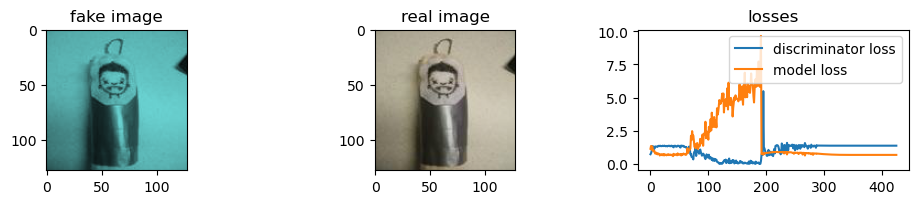

Epoch 426/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 427/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 428/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 429/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 430/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 36.0s

Validation loss = 2.400951623916626


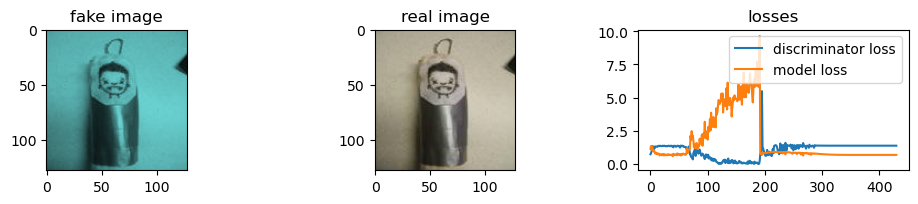

Epoch 431/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 36.0s
Epoch 432/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 433/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 434/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 435/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3966379165649414


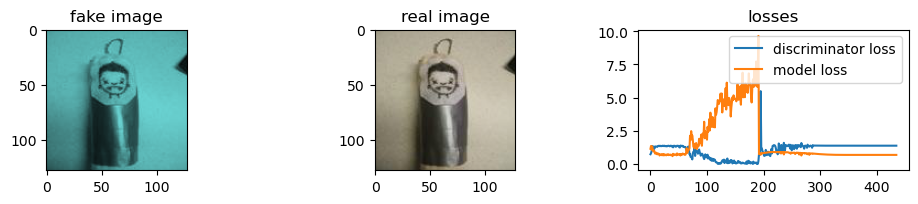

Epoch 436/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 437/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 438/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 36.0s
Epoch 439/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 440/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3976199626922607


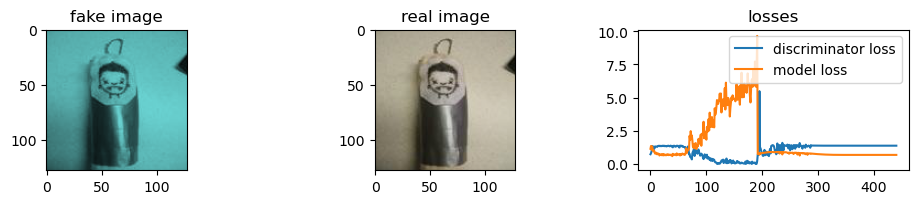

Epoch 441/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 442/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 443/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 36.0s
Epoch 444/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 36.0s
Epoch 445/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.4027833938598633


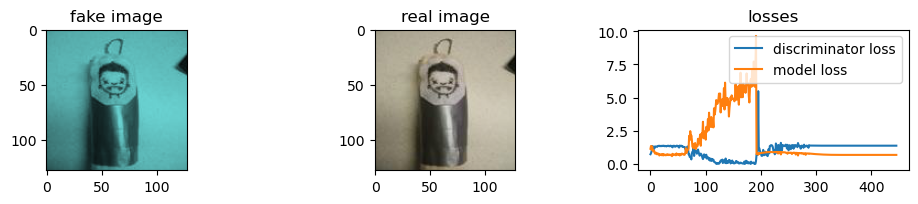

Epoch 446/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 447/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 448/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 449/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 36.0s
Epoch 450/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3978559970855713


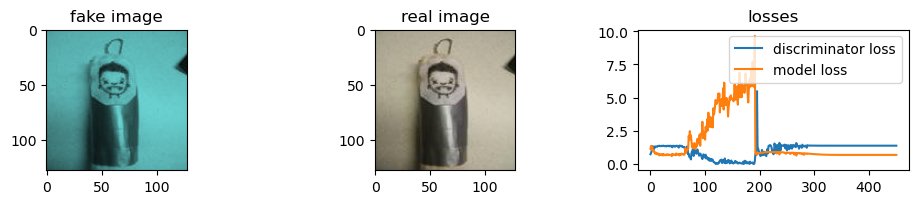

Epoch 451/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 452/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 453/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 454/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 455/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3947365283966064


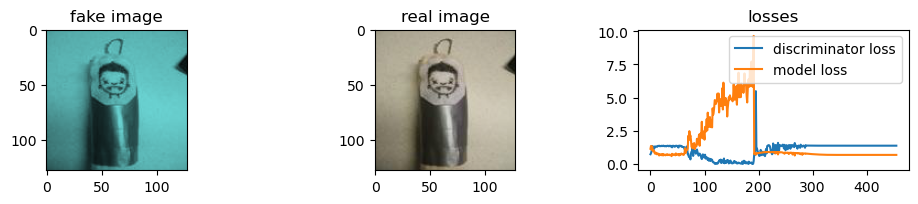

Epoch 456/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 457/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 458/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 459/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 460/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.400042772293091


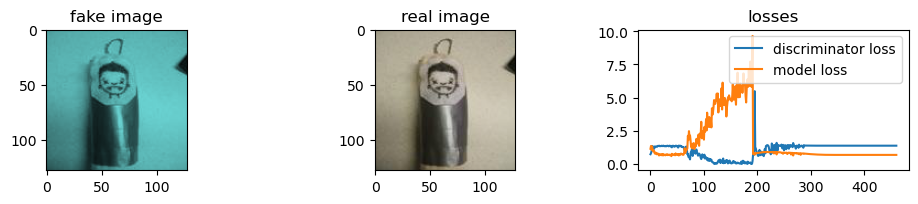

Epoch 461/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 462/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 463/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 464/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 465/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.4012022018432617


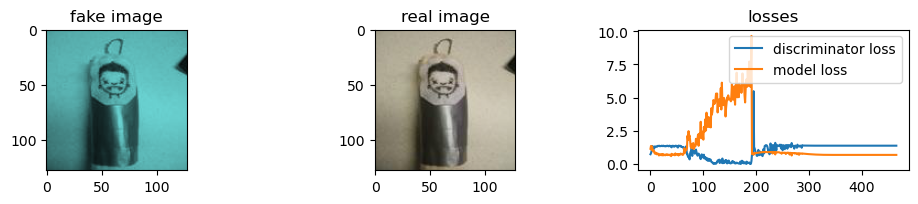

Epoch 466/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 467/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 468/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 469/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 470/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.395913600921631


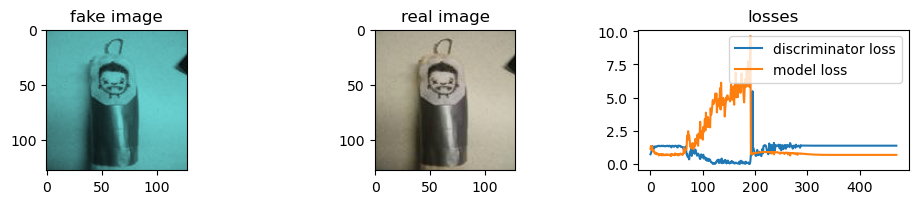

Epoch 471/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 472/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 473/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 474/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 475/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3986589908599854


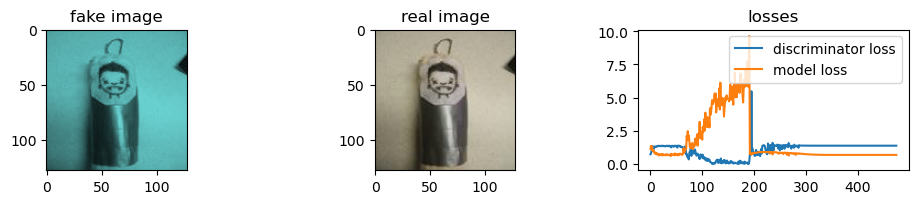

Epoch 476/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 477/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 478/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 479/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 480/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.395387887954712


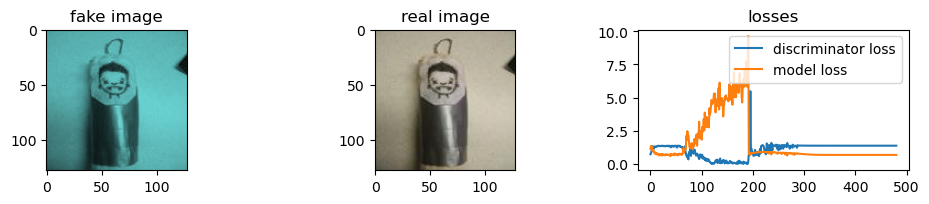

Epoch 481/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 482/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 483/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 484/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 485/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.394470691680908


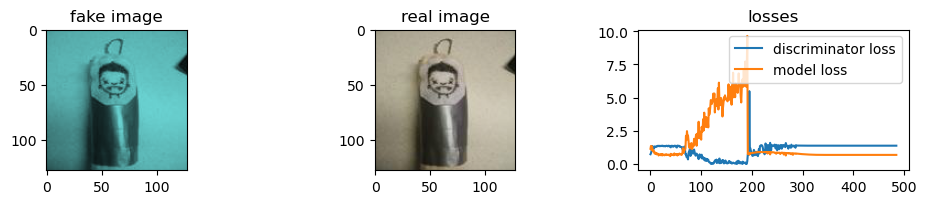

Epoch 486/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 487/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 488/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 489/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 490/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.396697998046875


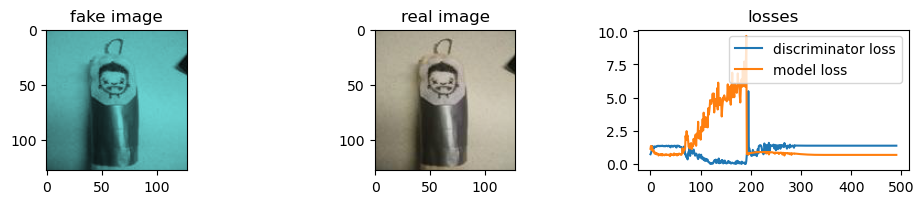

Epoch 491/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 492/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 493/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 494/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 495/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3973896503448486


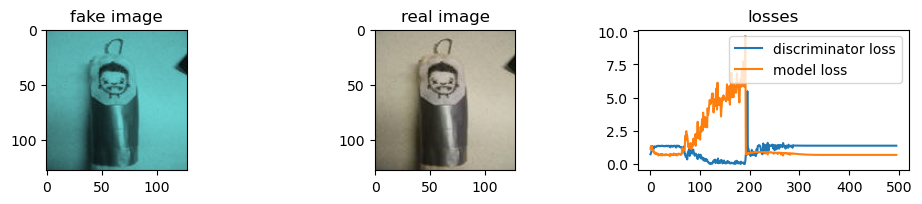

Epoch 496/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 497/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 498/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 499/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 500/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.391023635864258


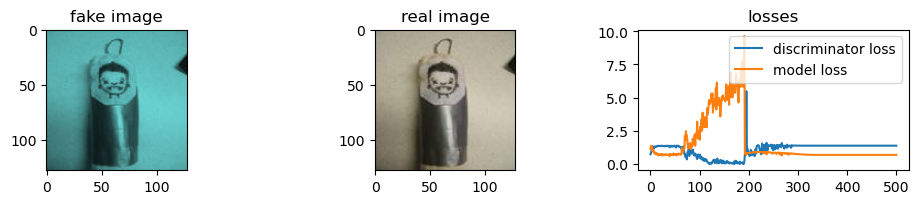

Epoch 501/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 502/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 503/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 504/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 505/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.4005346298217773


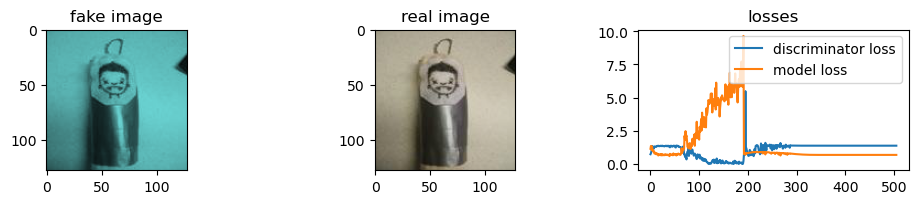

Epoch 506/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 507/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 508/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 509/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 510/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.400975227355957


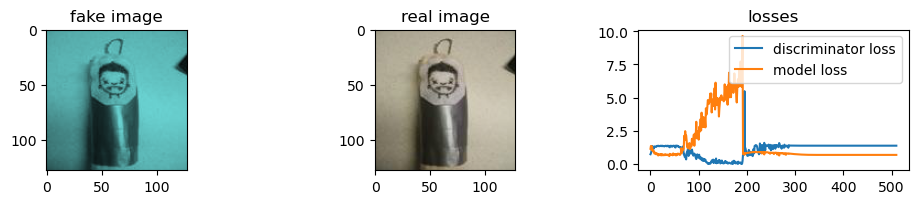

Epoch 511/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 512/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 513/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 514/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 515/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.4005815982818604


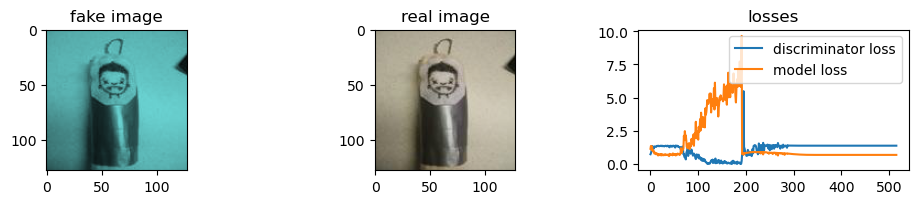

Epoch 516/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 517/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 518/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 519/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 520/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3997342586517334


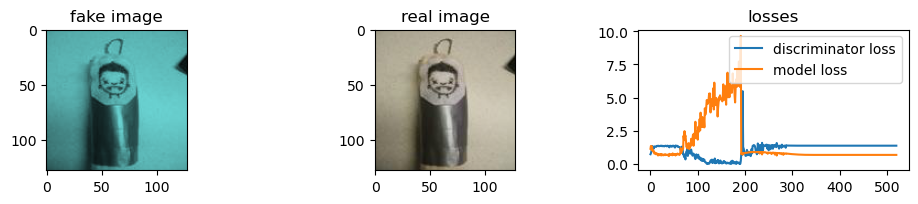

Epoch 521/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 522/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 523/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 524/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 525/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3958353996276855


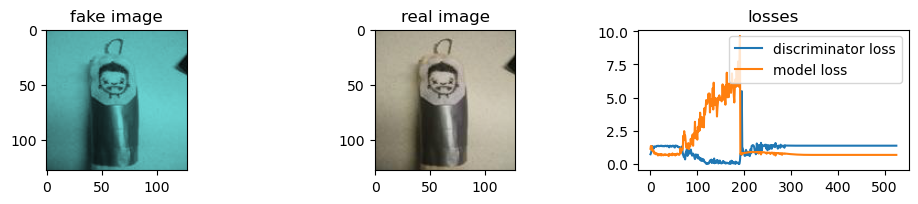

Epoch 526/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 527/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 528/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 529/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 530/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.39640736579895


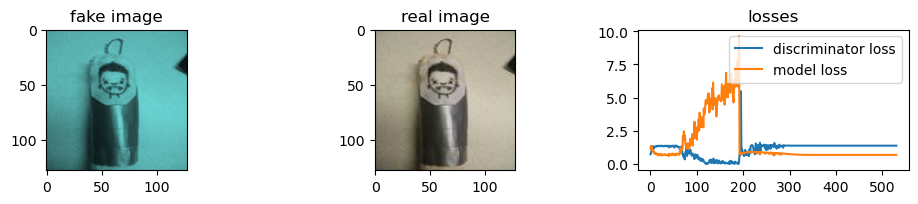

Epoch 531/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 532/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 533/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 534/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 535/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.399601936340332


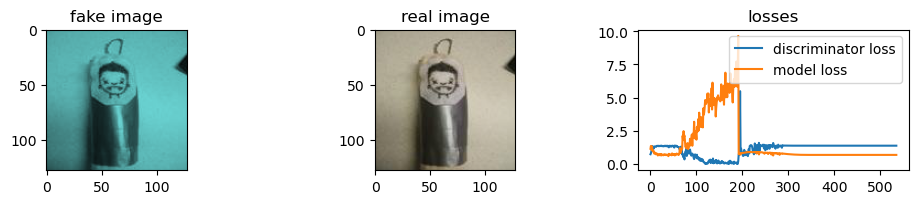

Epoch 536/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 537/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 538/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 539/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 540/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.3978044986724854


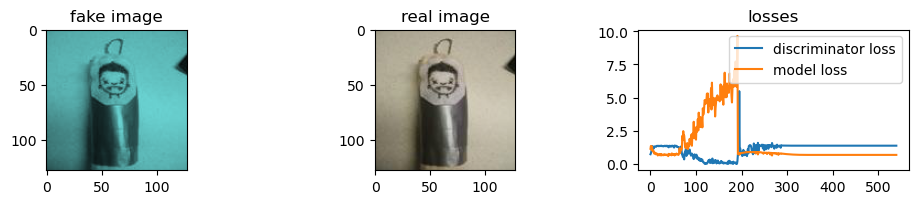

Epoch 541/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 542/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 543/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 544/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 545/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.400228500366211


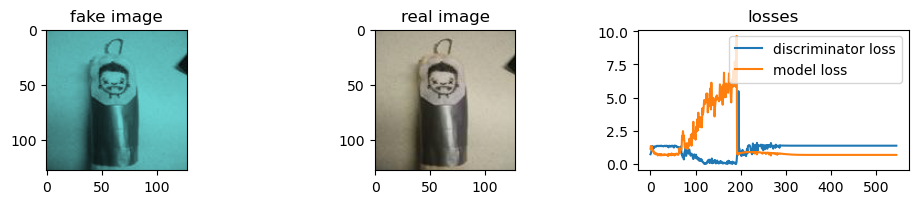

Epoch 546/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 547/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 548/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 549/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 550/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s

Validation loss = 2.39604115486145


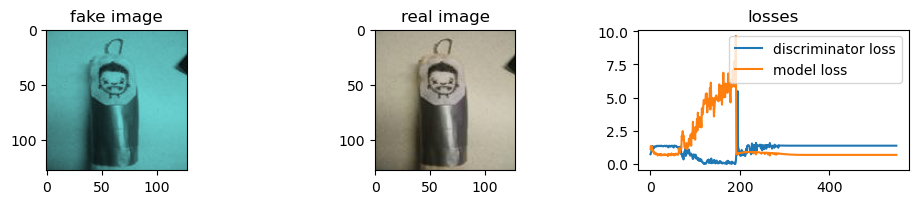

Epoch 551/1000: <==========> ------- disc loss = 1.3862943649291992, model loss = 0.6931471824645996, time = 37.0s
Epoch 552/1000: <====

KeyboardInterrupt: 

In [11]:
%matplotlib inline
losses = train_model3(model, discriminator, train_loader, epochs = 1000, device = DEVICE)